### Photometric conversion and alert triggering for simulated ZTF IMBH TDE transients

In [147]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from typing import Iterable, Tuple
from fink_utils.photometry.conversion import dc_mag


ALERT_FILE = "/Users/rupesh/CRP8/ymc/raw_data/fink_data/ZTF18aadkuel.csv"
DR_PHOTOMETRY_FILE = "/Users/rupesh/CRP8/ymc/raw_data/dr_photometry/ZTF18aadkuel.csv"

MJD_TOLERANCE = 1e-5
ZTF_MAG_LIMIT = 23.5

BAND_MAPPING = {"zg": 1, "zr": 2, "zi": 3}
FILTER_MAPPING_INV = {1: "zg", 2: "zr", 3: "zi"}
COLORS = {1: "#141E3C", 2: "#FF5B0B", 3: "#F2FF36"}

In [148]:

def preprocess_alert_df(df: pd.DataFrame) -> pd.DataFrame:
    required_cols = [
        "i:magpsf", "i:sigmapsf",
        "i:magnr", "i:sigmagnr",
        "i:isdiffpos", "i:jd", "i:fid",
    ]
    df = df.dropna(subset=required_cols).copy()
    df["mjd"] = df["i:jd"] - 2400000.5
    return df


def match_dr_mag(
    dr_df: pd.DataFrame,
    filter_code: str,
    mjds: Iterable[float],
    tol: float = MJD_TOLERANCE,
) -> list:
    sub = dr_df[dr_df["filtercode"] == filter_code]
    return [
        sub.loc[np.abs(sub["mjd"] - mjd) < tol, "mag"].iloc[0]
        if np.any(np.abs(sub["mjd"] - mjd) < tol)
        else np.nan
        for mjd in mjds
    ]


def dc_to_difference_mag(
    dc_mag: float,
    dc_sigmag: float,
    magnr: float,
    sigmagnr: float,
    clip_limit: float = ZTF_MAG_LIMIT,
) -> Tuple[float, float, int]:

    if pd.isna(dc_mag) or pd.isna(magnr) or magnr < 0:
        return np.nan, np.nan, 0

    f_dc = 10 ** (-0.4 * dc_mag)
    f_ref = 10 ** (-0.4 * magnr)

    sigf_dc = (dc_sigmag / 1.0857) * f_dc
    sigf_ref = (sigmagnr / 1.0857) * f_ref

    f_diff = f_dc - f_ref
    isdiffpos = int(f_diff >= 0)
    f_diff = abs(f_diff)

    if f_diff <= 1e-12:
        return np.nan, np.nan, isdiffpos

    sigf_diff = np.sqrt(sigf_dc**2 + sigf_ref**2)

    magpsf = -2.5 * np.log10(f_diff)
    sigmapsf = (sigf_diff / f_diff) * 1.0857

    if magpsf > clip_limit:
        return np.nan, np.nan, isdiffpos

    return magpsf, sigmapsf, isdiffpos


def convert_to_dc_mag(alert_df: pd.DataFrame) -> pd.DataFrame:
    res = alert_df.apply(
        lambda r: dc_mag(
            r["i:magpsf"],
            r["i:sigmapsf"],
            r["i:magnr"],
            r["i:sigmagnr"],
            r["i:isdiffpos"],
        ),
        axis=1,
    )

    alert_df[["mag_from_diff", "magerr_from_diff"]] = pd.DataFrame(
        res.tolist(), index=alert_df.index
    )
    return alert_df


In [149]:
alert_df = preprocess_alert_df(pd.read_csv(ALERT_FILE))
alert_df = convert_to_dc_mag(alert_df)

dr_df = pd.read_csv(DR_PHOTOMETRY_FILE)

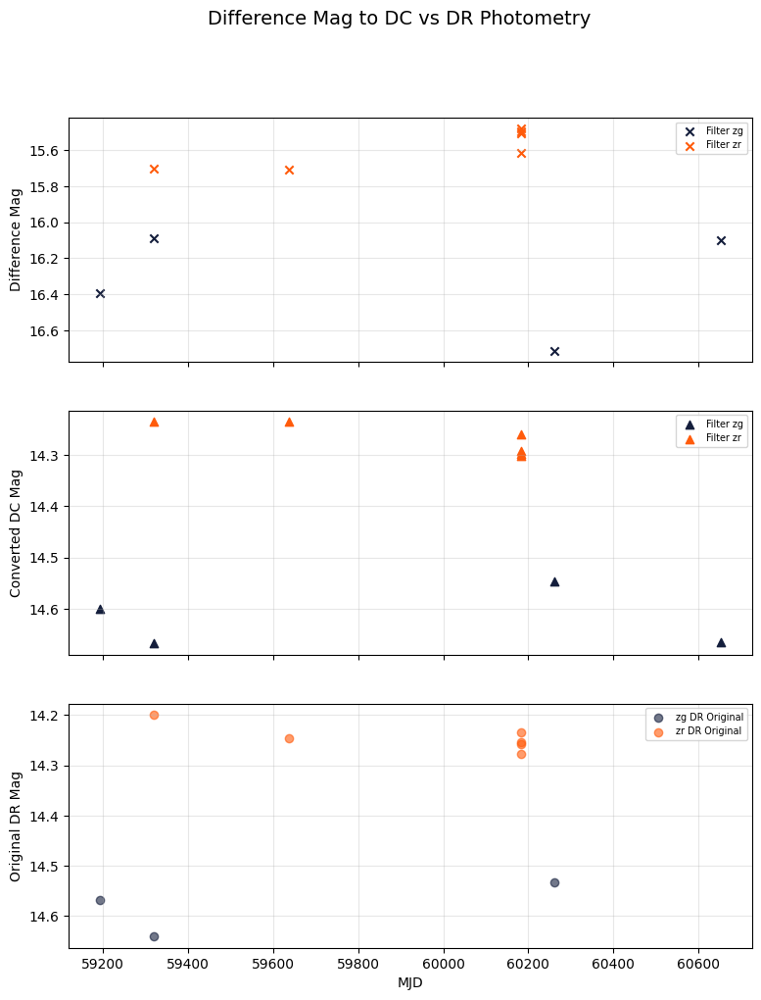

In [150]:
fig1, axes1 = plt.subplots(3, 1, figsize=(9, 11), sharex=True)

# Difference to DR mag conversion
for fid in [1, 2]:
    f_alert = alert_df[alert_df["i:fid"] == fid].sort_values("mjd")
    if f_alert.empty:
        continue

    color = COLORS[fid]
    fid_text = FILTER_MAPPING_INV[fid]
    axes1[0].scatter(
        f_alert["mjd"], f_alert["i:magpsf"],
        color=color, marker="x", label=f"Filter {fid_text}"
    )

    axes1[1].scatter(
        f_alert["mjd"], f_alert["mag_from_diff"],
        color=color, marker="^", label=f"Filter {fid_text}"
    )

    dr_mags_matched = match_dr_mag(
        dr_df, FILTER_MAPPING_INV[fid], f_alert["mjd"]
    )

    axes1[2].scatter(
        f_alert["mjd"], dr_mags_matched,
        color=color, marker="o",
        alpha=0.6, label=f"{fid_text} DR Original"
    )
axes1[0].set_ylabel("Difference Mag")
axes1[1].set_ylabel("Converted DC Mag")
axes1[2].set_ylabel("Original DR Mag")  
axes1[2].set_xlabel("MJD")
for ax in axes1:
    ax.invert_yaxis()
    ax.legend(fontsize="x-small")
    ax.grid(alpha=0.3)

fig1.suptitle("Difference Mag to DC vs DR Photometry", fontsize=14)
plt.show()

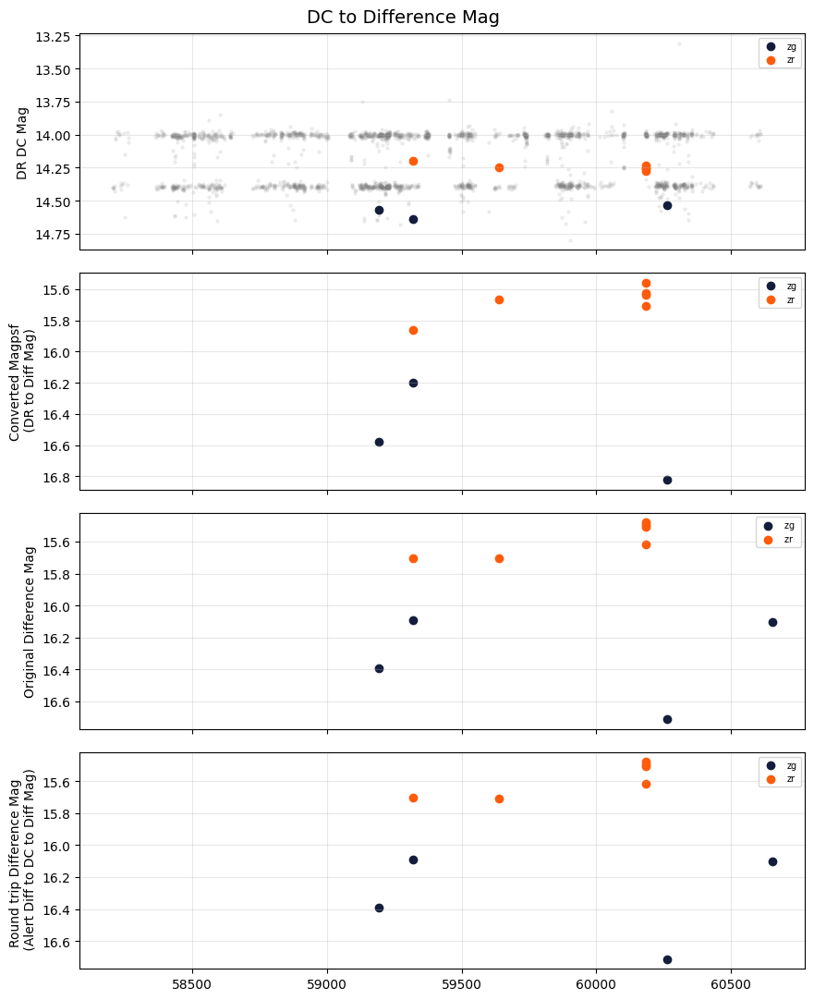

In [151]:
# DR to Difference mag conversion

fig2, axes2 = plt.subplots(4, 1, figsize=(9, 11), sharex=True)
axes2[0], axes2[1], axes2[2], _ = axes2
dr_difference_mag_list = []
alert_conv_difference_mag_list = []
for band, fid in BAND_MAPPING.items():
    if fid not in [1, 2]:
        continue

    f_alert = alert_df[alert_df["i:fid"] == fid].copy()
    if f_alert.empty:
        continue

    magnr = f_alert["i:magnr"].iloc[0]
    sigmagnr = f_alert["i:sigmagnr"].iloc[0]

    dr_band = dr_df[dr_df["filtercode"] == band]

    is_match = dr_band["mjd"].apply(
        lambda x: np.any(np.abs(f_alert["mjd"] - x) < MJD_TOLERANCE)
    )
    dr_match = dr_band[is_match].copy()

    if dr_match.empty:
        continue

    # DR DC to Difference
    dr_conv = dr_match.apply(
        lambda r: dc_to_difference_mag(
            r["mag"], r["magerr"], magnr, sigmagnr
        ),
        axis=1,
    )
    dr_match[["magpsf_conv", "sigmapsf_conv", "idp_conv"]] = pd.DataFrame(
        dr_conv.tolist(), index=dr_match.index
    )
    dr_difference_mag_list.append(dr_match)

    axes2[0].scatter(
        dr_band["mjd"], dr_band["mag"],
        color="gray", alpha=0.1, s=5
    )
    axes2[0].scatter(
        dr_match["mjd"], dr_match["mag"],
        color=COLORS[fid], label=f"{band}"
    )

    axes2[1].scatter(
        dr_match["mjd"], dr_match["magpsf_conv"],
        color=COLORS[fid], marker="o",
        label=f"{band}"
    )

    axes2[2].scatter(
        f_alert["mjd"], f_alert["i:magpsf"],
        color=COLORS[fid], marker="o",
        label=f"{band} "
    )

    # Diff to DC to Diff (Round trip)
    alert_conv = f_alert.apply(
        lambda r: dc_to_difference_mag(
            r["mag_from_diff"],
            r["magerr_from_diff"],
            magnr,
            sigmagnr,
        ),
        axis=1,
    )
    f_alert[["magpsf_conv_rt", "sigmapsf_conv_rt", "idp_conv_rt"]] = pd.DataFrame(
        alert_conv.tolist(), index=f_alert.index
    )
    alert_conv_difference_mag_list.append(f_alert)

    axes2[3].scatter(
        f_alert["mjd"], f_alert["magpsf_conv_rt"],
        color=COLORS[fid], marker="o",
        label=f"{band}"
    )

axes2[0].set_ylabel("DR DC Mag")
axes2[1].set_ylabel("Converted Magpsf\n (DR to Diff Mag)")
axes2[2].set_ylabel("Original Difference Mag")
axes2[3].set_ylabel("Round trip Difference Mag \n (Alert Diff to DC to Diff Mag)")

for ax in axes2:
    ax.invert_yaxis()
    ax.legend(fontsize="x-small")
    ax.grid(alpha=0.3)

fig2.suptitle("DC to Difference Mag", fontsize=14)

plt.tight_layout()
plt.show()

### Alert generation

In [152]:
# Trigger alert
# Section 9.1 (Page 65) https://irsa.ipac.caltech.edu/data/ZTF/docs/ztf_explanatory_supplement.pdf

SIGMA_THRESH = 5  # For 5-sigma detection

def compute_snr(sigmapsf):
    return np.where(
        pd.notna(sigmapsf) & (sigmapsf > 0),
        1.0857 / sigmapsf,
        0.0,
    )

def is_trigger_alert(snr):
    return snr > SIGMA_THRESH


alert_df["snr"] = compute_snr(alert_df["i:sigmapsf"])
alert_df["is_alert"] = is_trigger_alert(alert_df["snr"])

alert_df["snr"] = compute_snr(alert_df["i:sigmapsf"])
alert_df["is_alert"] = is_trigger_alert(alert_df["snr"])

alert_conv_difference_mag_df = pd.concat(alert_conv_difference_mag_list)
alert_conv_difference_mag_df["snr"] = compute_snr(alert_conv_difference_mag_df["sigmapsf_conv_rt"])
alert_conv_difference_mag_df["is_alert"] = is_trigger_alert(alert_conv_difference_mag_df["snr"])

dr_difference_mag_df = pd.concat(dr_difference_mag_list)
dr_difference_mag_df["snr"] = compute_snr(dr_difference_mag_df["sigmapsf_conv"])
dr_difference_mag_df["is_alert"] = is_trigger_alert(dr_difference_mag_df["snr"])

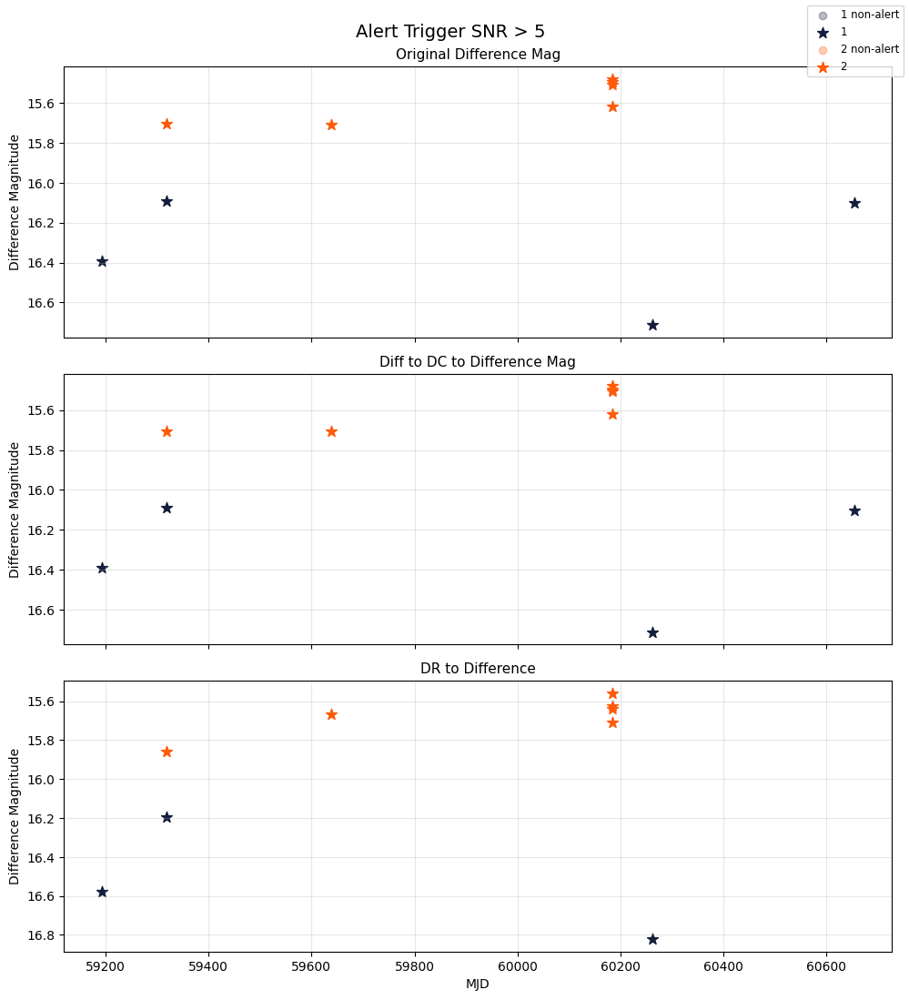

In [153]:
FILTER_COLORS = {
    "zg": COLORS[1],
    "zr": COLORS[2],
    "zi": COLORS.get(3, "yellow"),
}

def plot_alert(ax, df, ycol, title, filter_col, color_map):
    for filt, color in color_map.items():
        df_f = df.loc[df[filter_col] == filt]
        if df_f.empty:
            continue

        is_alert = df_f["is_alert"]
        not_alert = ~is_alert

        # Non alerts
        ax.scatter(
            df_f.loc[not_alert, "mjd"],
            df_f.loc[not_alert, ycol],
            color=color,
            marker="o",
            alpha=0.3,
            label=f"{filt} non-alert",
        )

        # Alerts
        ax.scatter(
            df_f.loc[is_alert, "mjd"],
            df_f.loc[is_alert, ycol],
            color=color,
            marker="*",
            s=80,
            label=f"{filt} ",
        )

    ax.set_title(title, fontsize=11)
    ax.set_ylabel("Difference Magnitude")
    ax.invert_yaxis()
    ax.grid(alpha=0.3)

fig, axes = plt.subplots(3, 1, figsize=(10, 11), sharex=True)

plot_alert(
    axes[0],
    alert_df,
    ycol="i:magpsf",
    title="Original Difference Mag",
    filter_col="i:fid",
    color_map=COLORS,
)

plot_alert(
    axes[1],
    alert_conv_difference_mag_df,
    ycol="magpsf_conv_rt",
    title="Diff to DC to Difference Mag",
    filter_col="i:fid",
    color_map=COLORS,
)

plot_alert(
    axes[2],
    dr_difference_mag_df,
    ycol="magpsf_conv",
    title="DR to Difference",
    filter_col="filtercode",
    color_map=FILTER_COLORS,
)

axes[-1].set_xlabel("MJD")

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc="upper right", fontsize="small")

fig.suptitle("Alert Trigger SNR > 5", fontsize=14)
plt.tight_layout()
plt.show()


In [154]:
# Trigger alert
# Section 9.1 (Page 65) https://irsa.ipac.caltech.edu/data/ZTF/docs/ztf_explanatory_supplement.pdf

SIGMA_THRESH = 5  # For 5-sigma detection

def compute_snr(sigmapsf):
    return np.where(
        pd.notna(sigmapsf) & (sigmapsf > 0),
        1.0857 / sigmapsf,
        0.0,
    )

def is_trigger_alert(snr):
    return snr > SIGMA_THRESH


alert_df["snr"] = compute_snr(alert_df["i:sigmapsf"])
alert_df["is_alert"] = is_trigger_alert(alert_df["snr"])

alert_df["snr"] = compute_snr(alert_df["i:sigmapsf"])
alert_df["is_alert"] = is_trigger_alert(alert_df["snr"])

alert_conv_difference_mag_df = pd.concat(alert_conv_difference_mag_list)
alert_conv_difference_mag_df["snr"] = compute_snr(alert_conv_difference_mag_df["sigmapsf_conv_rt"])
alert_conv_difference_mag_df["is_alert"] = is_trigger_alert(alert_conv_difference_mag_df["snr"])

dr_difference_mag_df = pd.concat(dr_difference_mag_list)
dr_difference_mag_df["snr"] = compute_snr(dr_difference_mag_df["sigmapsf_conv"])
dr_difference_mag_df["is_alert"] = is_trigger_alert(dr_difference_mag_df["snr"])

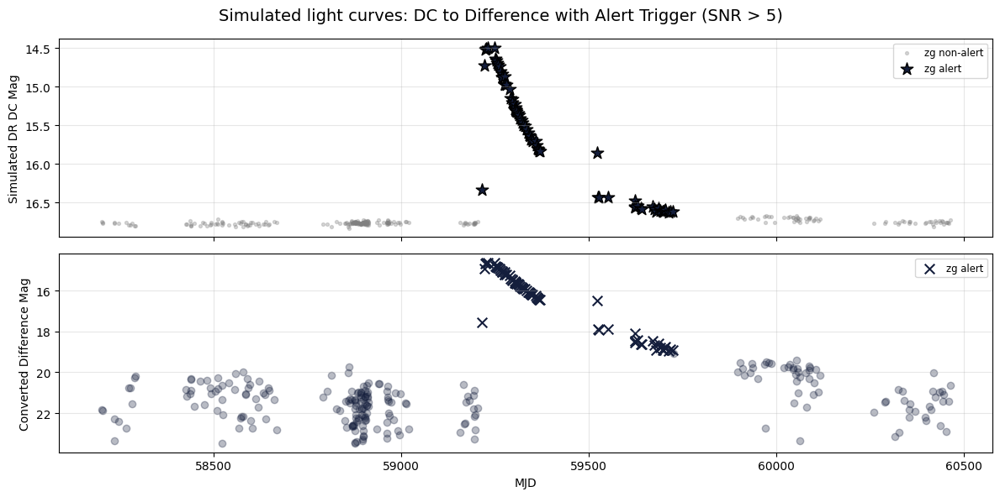

In [155]:
# Run simulated data

simulated_dr_file = "/Users/rupesh/CRP8/ymc/simulated_data/ZTF19acmwxxe/data/ZTF19acmwxxe_bh100000.0_m10_r10_eta0.1_fv1_d100.csv"
alert_file = "/Users/rupesh/CRP8/ymc/raw_data/fink_data/ZTF19acmwxxe.csv"

simulated_dr_df = pd.read_csv(simulated_dr_file)
alert_df = pd.read_csv(alert_file)

fig2, axes2 = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
ax_dc, ax_diff = axes2

for band, fid in BAND_MAPPING.items():
    if fid not in [1, 2]:
        continue

    f_alert = alert_df.loc[alert_df["i:fid"] == fid].copy()
    if f_alert.empty:
        continue

    magnr = f_alert["i:magnr"].iloc[0]
    sigmagnr = f_alert["i:sigmagnr"].iloc[0]

    sim_band = simulated_dr_df.loc[
        simulated_dr_df["filtercode"] == band
    ].copy()

    if sim_band.empty:
        continue

    conv = sim_band.apply(
        lambda r: dc_to_difference_mag(
            r["simulated_mag"],
            r["magerr"],
            magnr,
            sigmagnr,
        ),
        axis=1,
    )

    sim_band[["magpsf_conv", "sigmapsf_conv", "idp_conv"]] = pd.DataFrame(
        conv.tolist(), index=sim_band.index
    )

    sim_band["snr"] = compute_snr(sim_band["sigmapsf_conv"])
    sim_band["is_alert"] = is_trigger_alert(sim_band["snr"])

    is_alert = sim_band["is_alert"]
    not_alert = ~is_alert
    color = COLORS[fid]


    ax_dc.scatter(
        sim_band.loc[not_alert, "mjd"],
        sim_band.loc[not_alert, "simulated_mag"],
        color="gray",
        alpha=0.3,
        s=8,
        label=f"{band} non-alert" if fid == 1 else None,
    )

    ax_dc.scatter(
        sim_band.loc[is_alert, "mjd"],
        sim_band.loc[is_alert, "simulated_mag"],
        color=color,
        marker="*",
        s=120,
        edgecolors="black",
        label=f"{band} alert",
    )


    ax_diff.scatter(
        sim_band.loc[not_alert, "mjd"],
        sim_band.loc[not_alert, "magpsf_conv"],
        color=color,
        alpha=0.3,
        marker="o",
    )

    ax_diff.scatter(
        sim_band.loc[is_alert, "mjd"],
        sim_band.loc[is_alert, "magpsf_conv"],
        color=color,
        marker="x",
        s=70,
        label=f"{band} alert",
    )

ax_dc.set_ylabel("Simulated DR DC Mag")
ax_diff.set_ylabel("Converted Difference Mag")

for ax in axes2:
    ax.invert_yaxis()
    ax.grid(alpha=0.3)
    ax.legend(fontsize="small")

ax_diff.set_xlabel("MJD")

fig2.suptitle(
    "Simulated light curves: DC to Difference with Alert Trigger (SNR > 5)",
    fontsize=14,
)

plt.tight_layout()
plt.show()


In [156]:
import os
import json
import pandas as pd
import matplotlib.pyplot as plt


def plot_simulated_dr_with_alerts_and_config(
    simulated_dr_file: str,
    alert_file: str,
    band_mapping: dict,
    colors: dict,
    object_id: str,
    sigma_thresh: float = 5.0,
    
):
    font_size = 10
    simulated_dr_df = pd.read_csv(simulated_dr_file)
    alert_df = pd.read_csv(alert_file)


    config_file = (
        simulated_dr_file
        .replace("/data/", "/config/")
        .replace(".csv", ".json")
    )

    with open(config_file, "r") as f:
        config = json.load(f)


    alert_df = alert_df.dropna(
        subset=["i:fid", "i:magnr", "i:sigmagnr"]
    ).copy()

    fig, axes = plt.subplots(2, 1, figsize=(10, 5), sharex=True)
    ax_dc, ax_diff = axes

    for band, fid in band_mapping.items():
        if fid not in [1, 2]:
            continue

        f_alert = alert_df.loc[alert_df["i:fid"] == fid].copy()
        if f_alert.empty:
            continue

        magnr = f_alert["i:magnr"].iloc[0]
        sigmagnr = f_alert["i:sigmagnr"].iloc[0]

        sim_band = simulated_dr_df.loc[
            simulated_dr_df["filtercode"] == band
        ].copy()

        if sim_band.empty:
            continue


        conv = sim_band.apply(
            lambda r: dc_to_difference_mag(
                r["simulated_mag"],
                r["magerr"],
                magnr,
                sigmagnr,
            ),
            axis=1,
        )

        sim_band[["magpsf_conv", "sigmapsf_conv", "idp_conv"]] = pd.DataFrame(
            conv.tolist(), index=sim_band.index
        )

        sim_band["snr"] = compute_snr(sim_band["sigmapsf_conv"])
        sim_band["is_alert"] = sim_band["snr"] > sigma_thresh

        is_alert = sim_band["is_alert"]
        not_alert = ~is_alert
        color = colors[fid]


        ax_dc.scatter(
            sim_band.loc[not_alert, "mjd"],
            sim_band.loc[not_alert, "simulated_mag"],
            color="gray",
            alpha=0.3,
            s=30,
        )

        ax_dc.scatter(
            sim_band.loc[is_alert, "mjd"],
            sim_band.loc[is_alert, "simulated_mag"],
            color=color,
            marker="*",
            s=120,
            label=f"{band} alert",
        )


        ax_diff.scatter(
            sim_band.loc[not_alert, "mjd"],
            sim_band.loc[not_alert, "magpsf_conv"],
            color=color,
            alpha=0.3,
            marker="o",
        )

        ax_diff.scatter(
            sim_band.loc[is_alert, "mjd"],
            sim_band.loc[is_alert, "magpsf_conv"],
            color=color,
            marker="x",
            s=70,
            label=f"{band} alert",
        )


    ax_dc.set_ylabel("Simulated DR DC Mag", fontsize=font_size)
    ax_diff.set_ylabel("Converted Difference Mag", fontsize=font_size)
    ax_diff.set_xlabel("MJD", fontsize=font_size)

    for ax in axes:
        ax.invert_yaxis()
        ax.grid(True, linestyle="--", alpha=0.6)
        ax.legend(fontsize=font_size)

    bh_mass = config.get("bh_mass")
    star_mstar = config.get("star_mstar")
    star_rstar = config.get("star_rstar", "N/A")
    start_mjd = int(config["start_mjd"])

    if isinstance(bh_mass, (int, float)):
        if bh_mass < 1e6:
            bh_mass_str = f"{bh_mass:.0f} M☉"
        else:
            bh_mass_str = f"{bh_mass / 1e6:.2f} ×10⁶ M☉"
    else:
        bh_mass_str = "N/A"
    star_mstar_str = f"{star_mstar:.2f}" if isinstance(star_mstar, (int, float)) else "N/A"

    if "distance_mpc" in config:
        distance_info = f"Distance: {config['distance_mpc']} Mpc"
    elif "redshift" in config:
        distance_info = f"Redshift: {config['redshift']}"
    else:
        distance_info = ""

    tde_info = (
        f"BH Mass: {bh_mass_str}, "
        f"Star Mass: {star_mstar_str} M☉, "
        f"Star Radius: {star_rstar} R☉, "
        f"{distance_info}, "
        f"Start MJD: {start_mjd}"
    )

    ax_dc.set_title(
        f"Simulated DR Light Curve (Alert Triggered)\n"
        f"Object ID: {object_id}",
        fontsize=font_size,
    )

    ax_diff.set_title(
        f"Converted Difference Magnitudes\n{tde_info}",
        fontsize=font_size,
    )
    plt.tight_layout()
    plt.show()
    plt.close(fig)


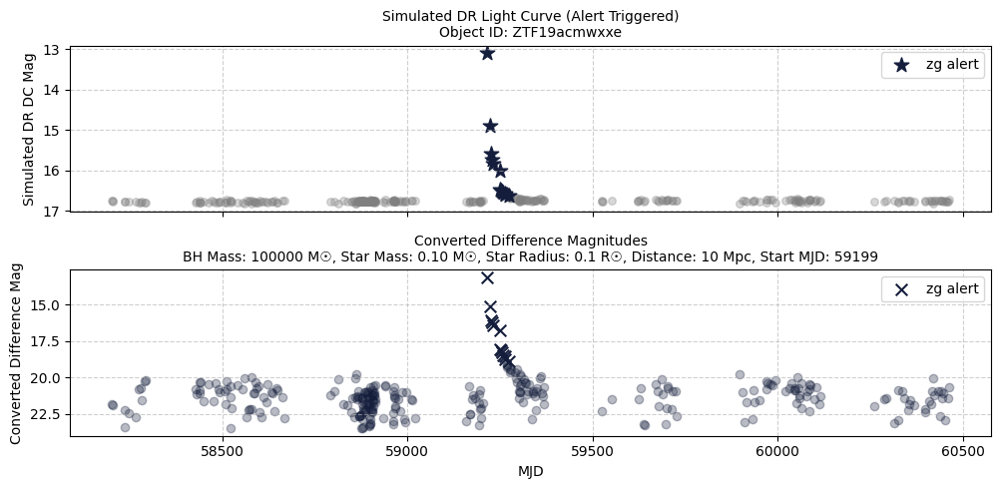

----------------------------------------


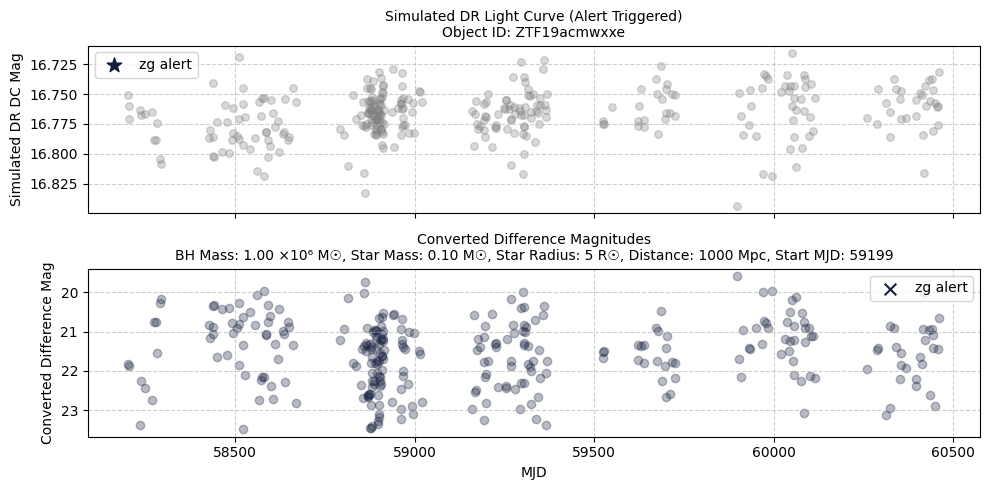

----------------------------------------


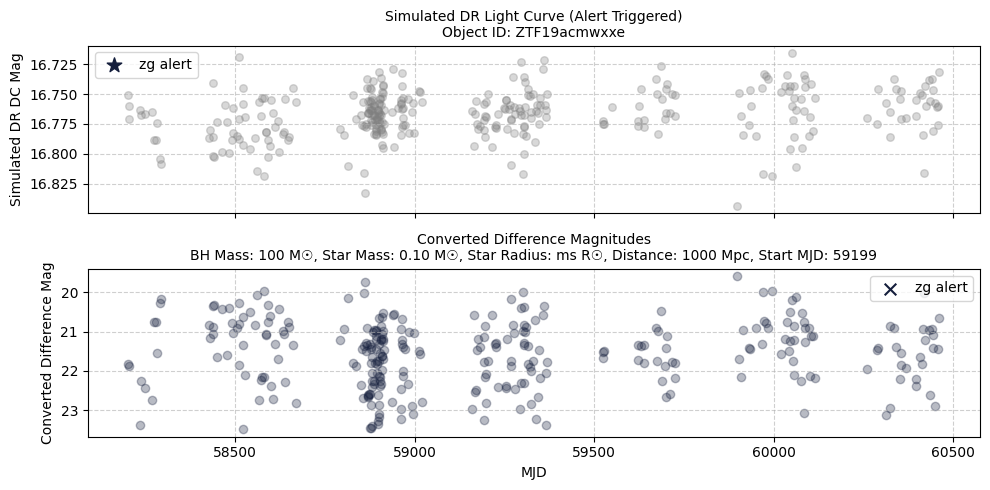

----------------------------------------


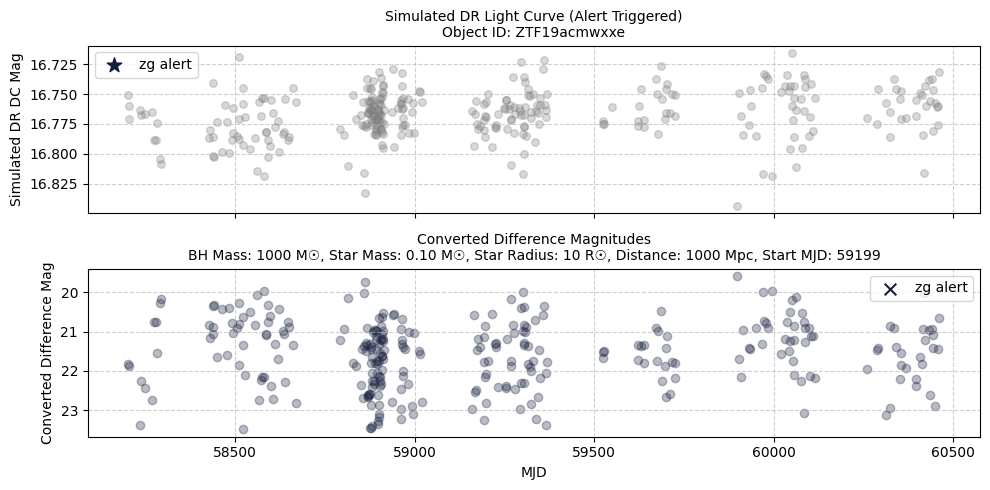

----------------------------------------


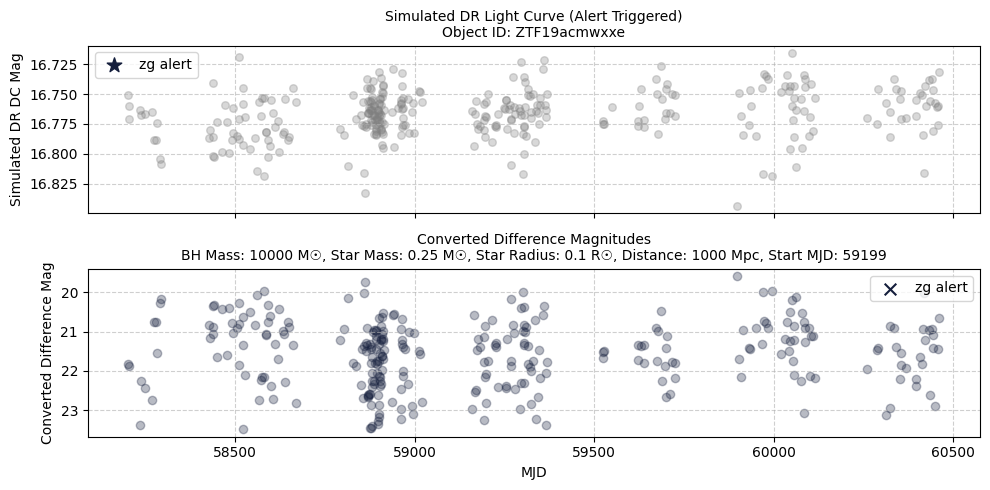

----------------------------------------


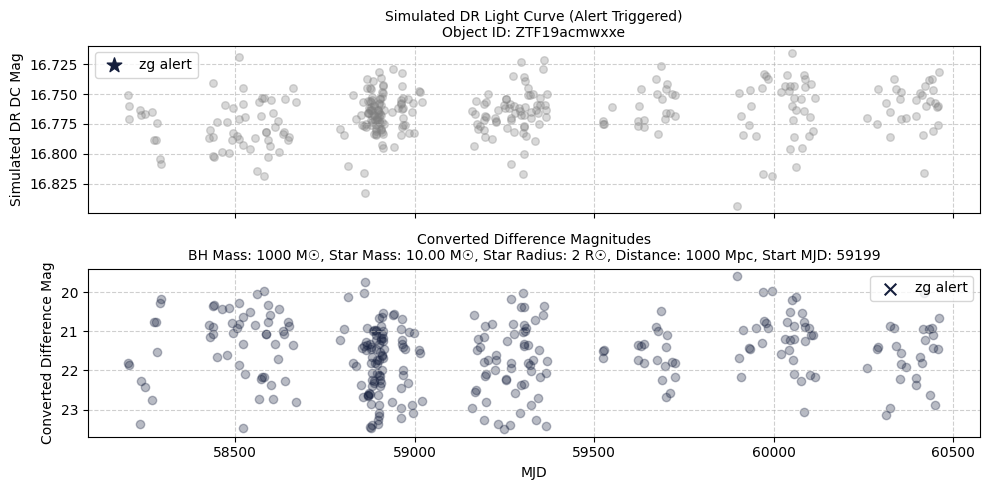

----------------------------------------


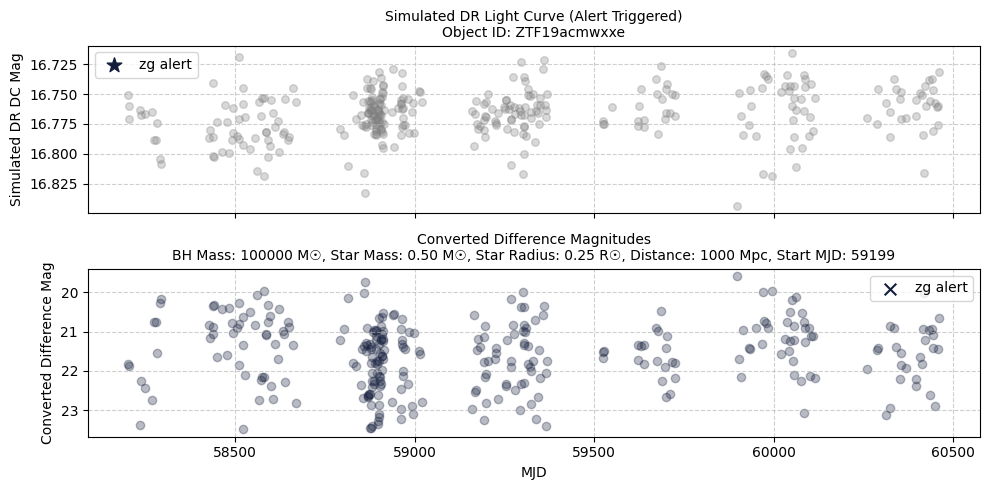

----------------------------------------


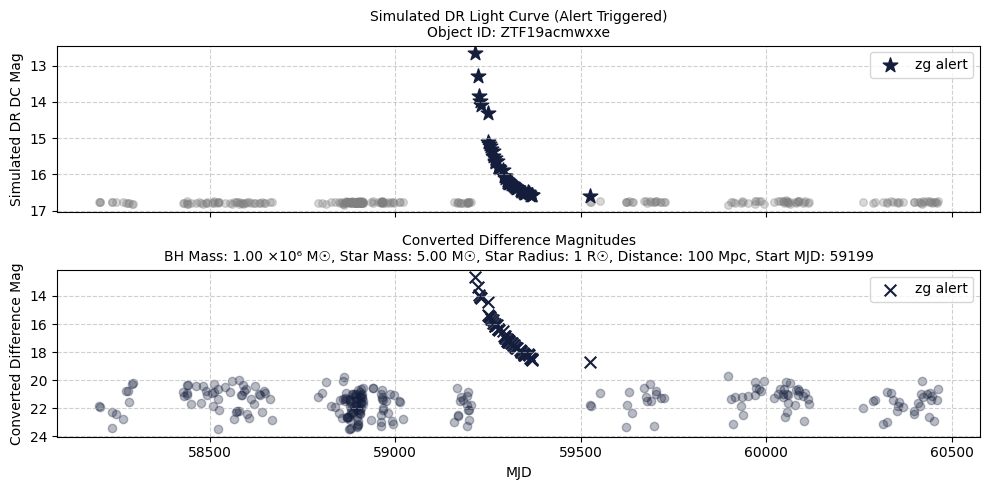

----------------------------------------


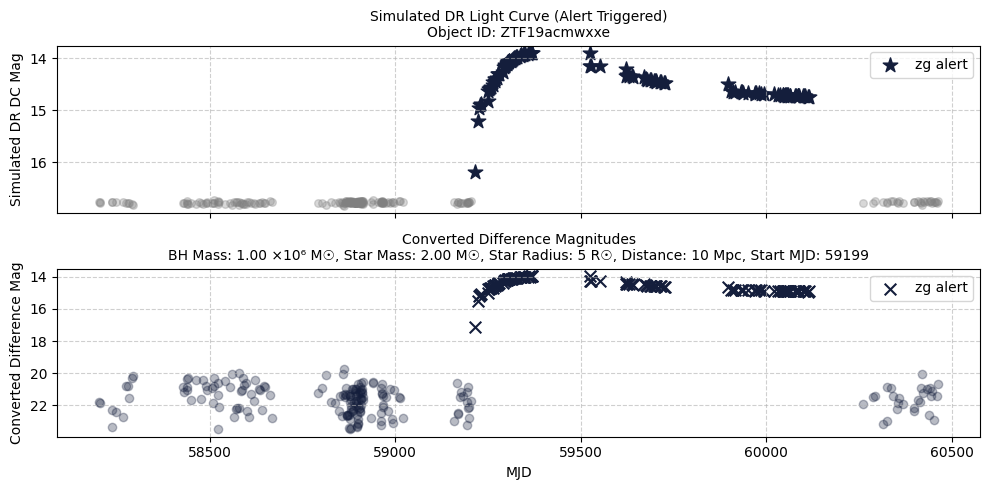

----------------------------------------


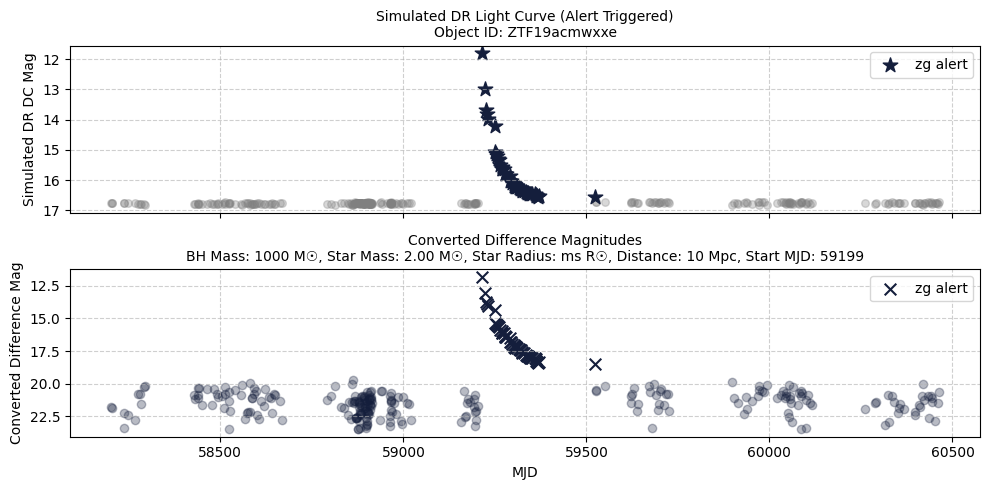

----------------------------------------


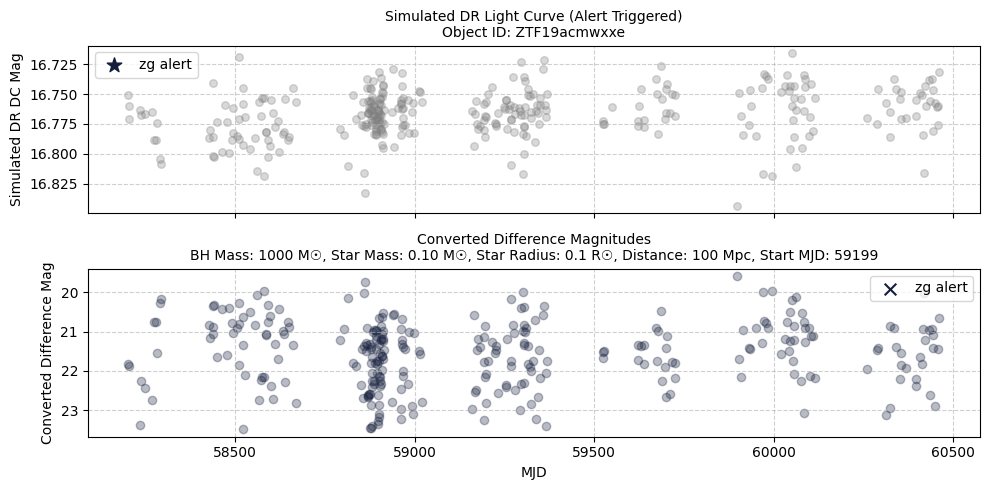

----------------------------------------


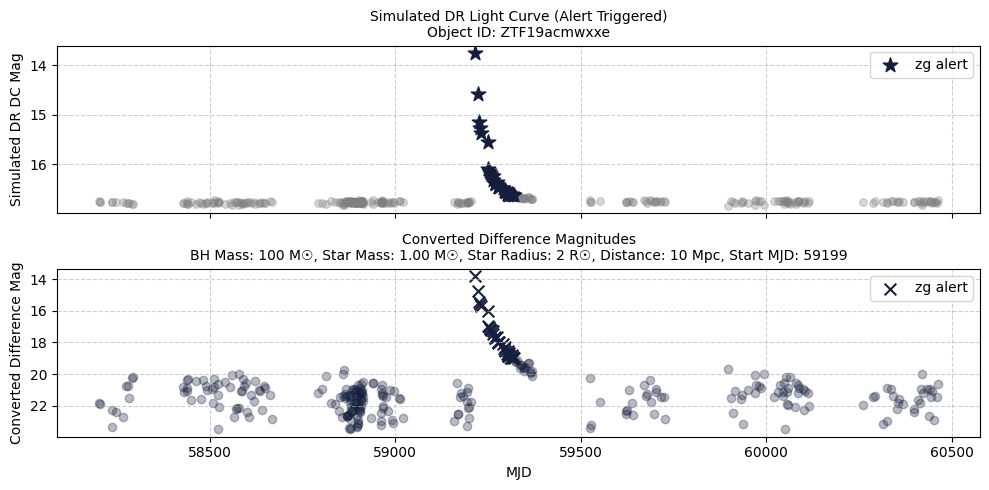

----------------------------------------


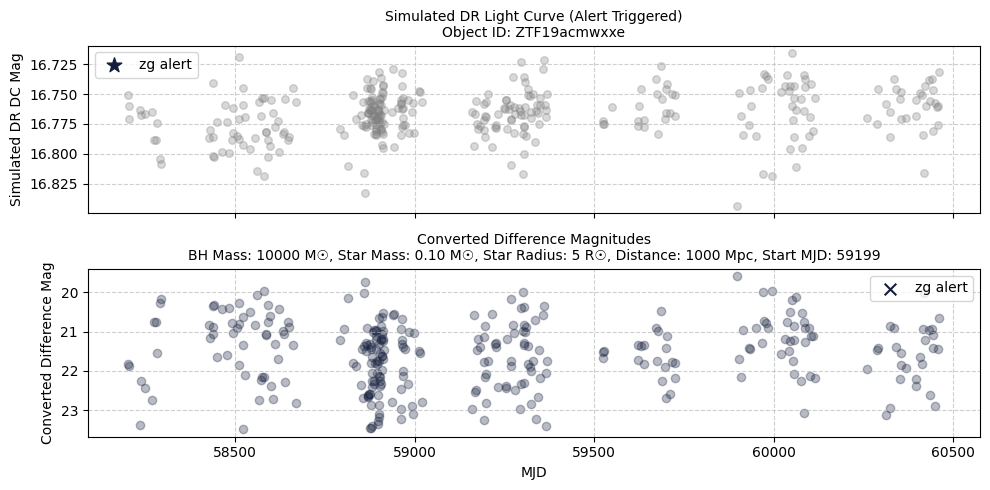

----------------------------------------


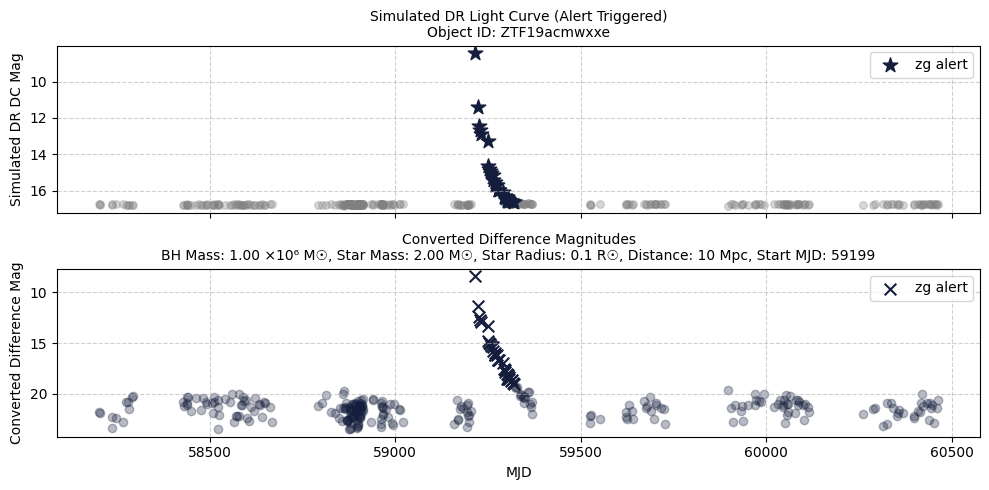

----------------------------------------


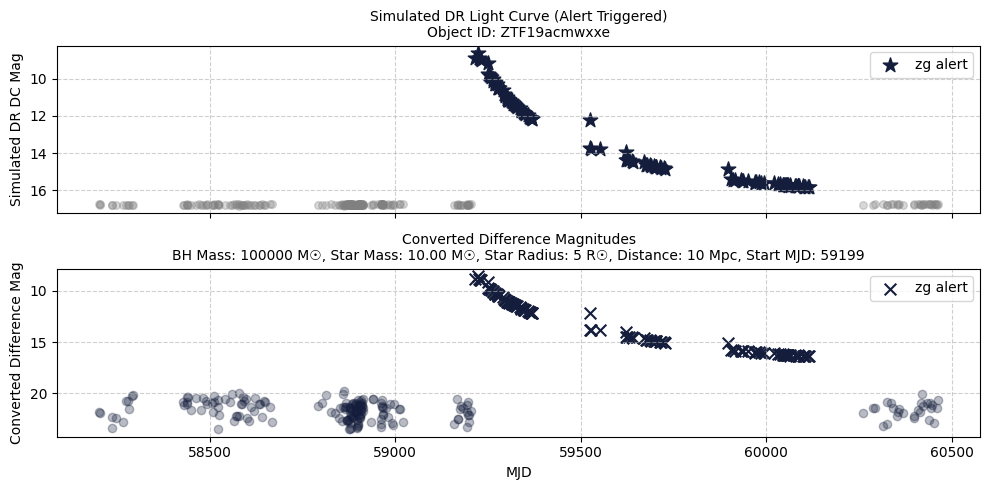

----------------------------------------


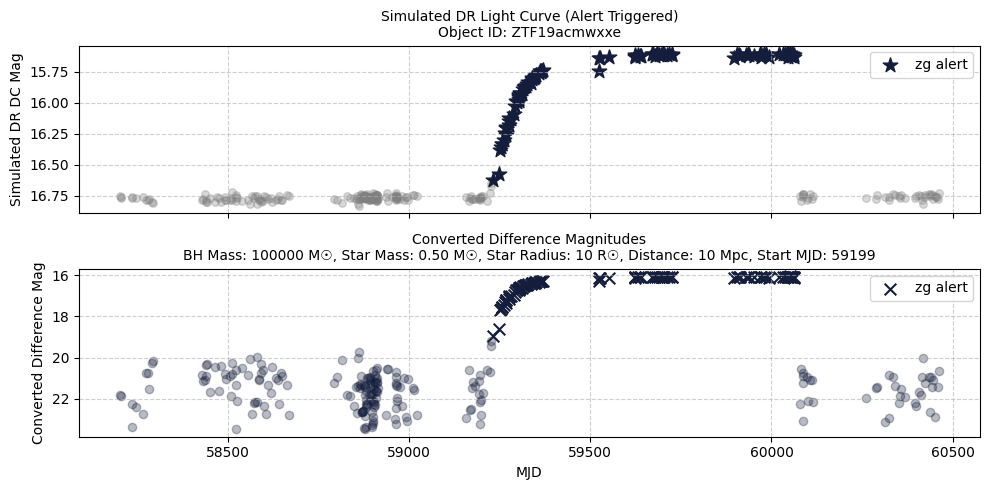

----------------------------------------


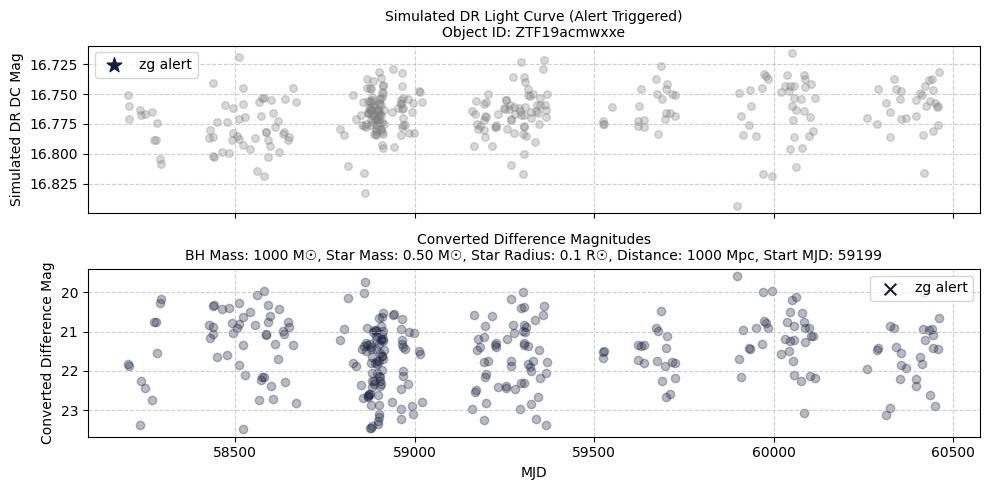

----------------------------------------


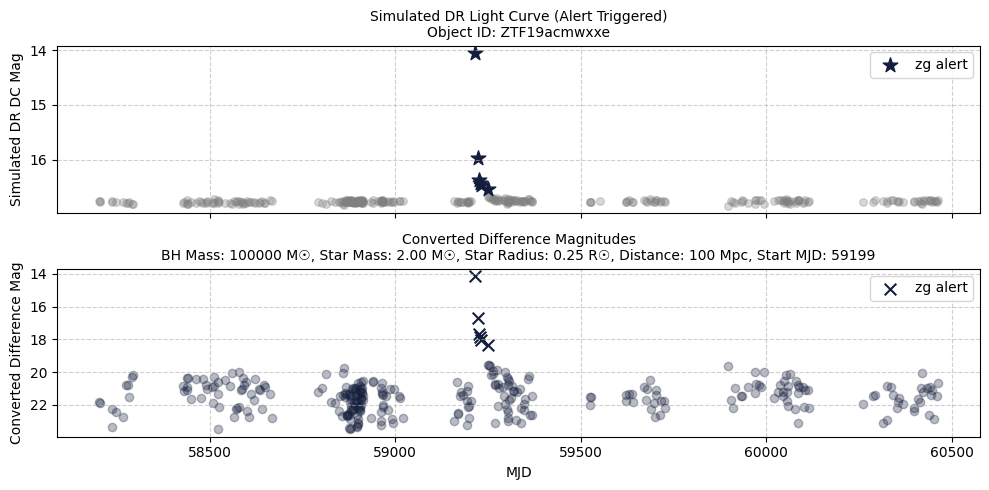

----------------------------------------


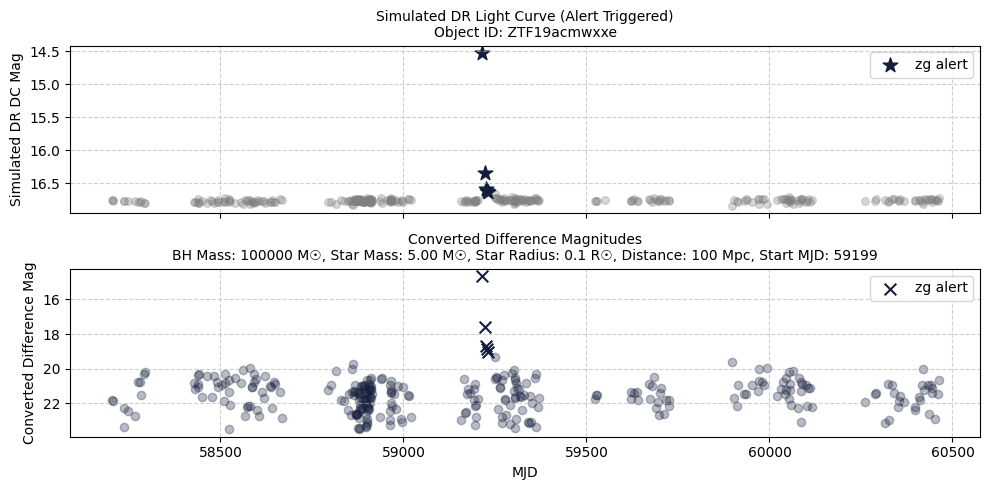

----------------------------------------


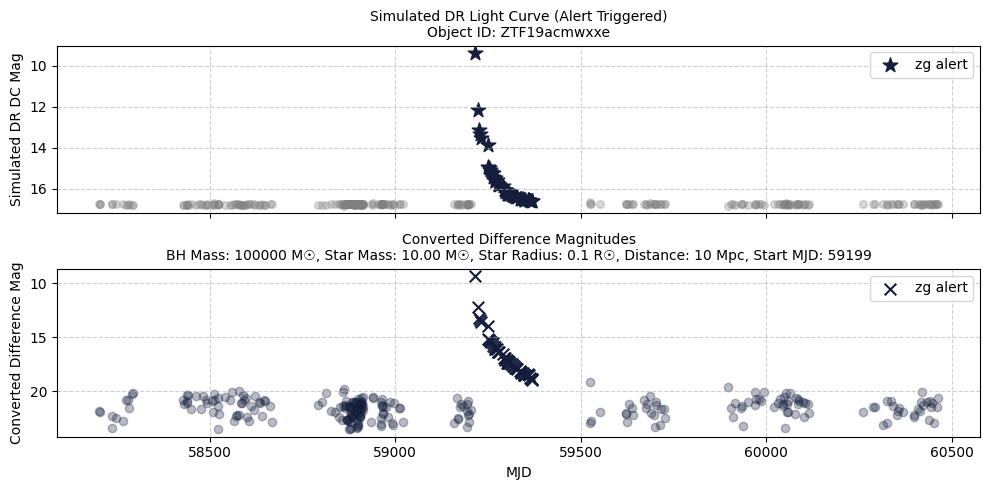

----------------------------------------


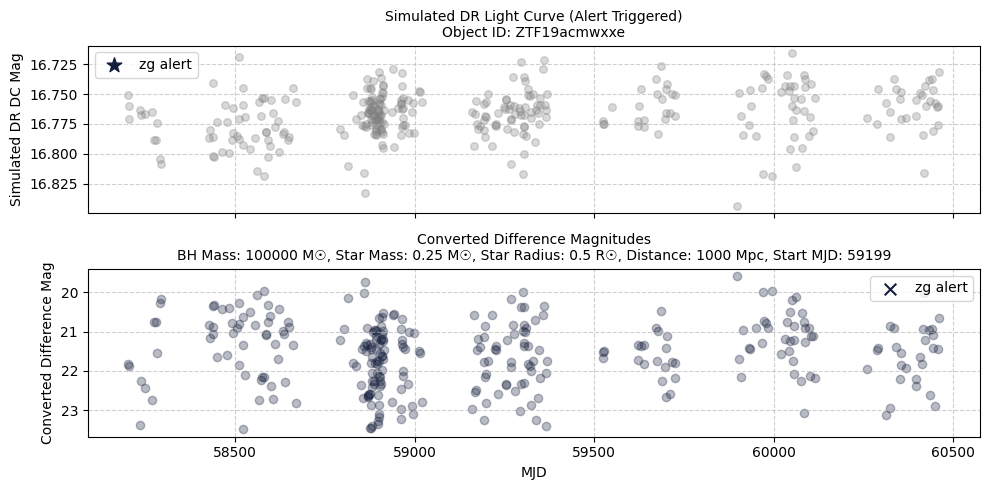

----------------------------------------


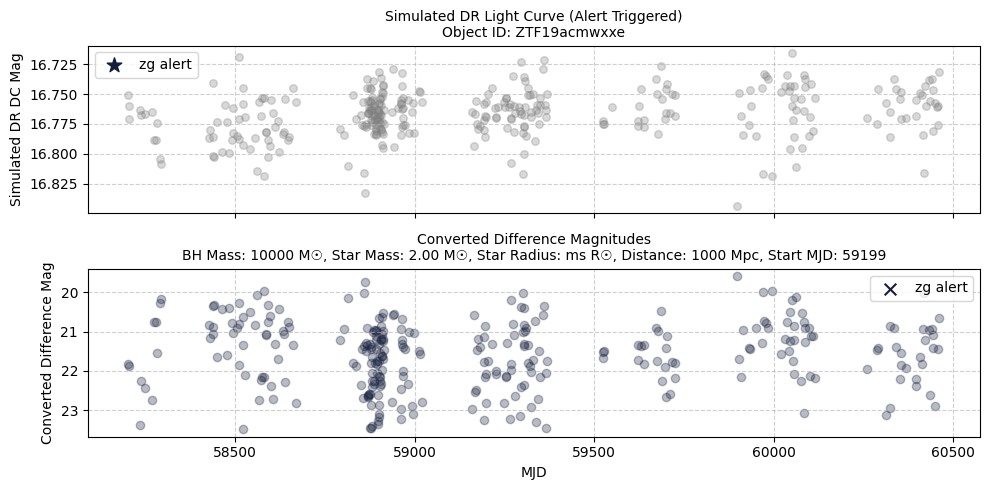

----------------------------------------


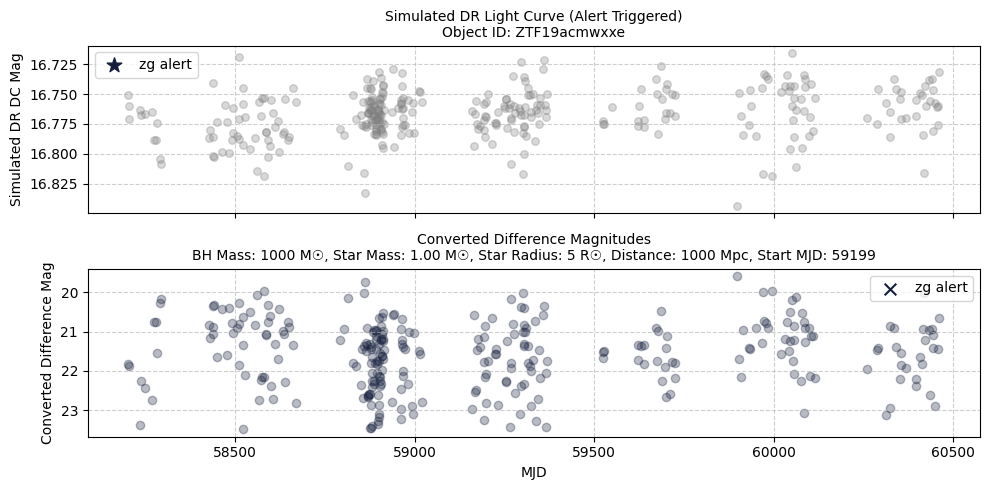

----------------------------------------


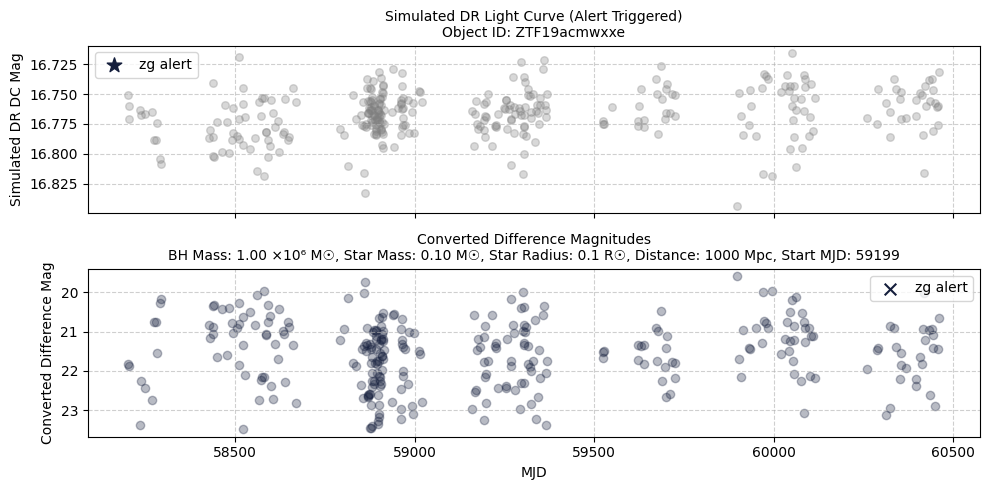

----------------------------------------


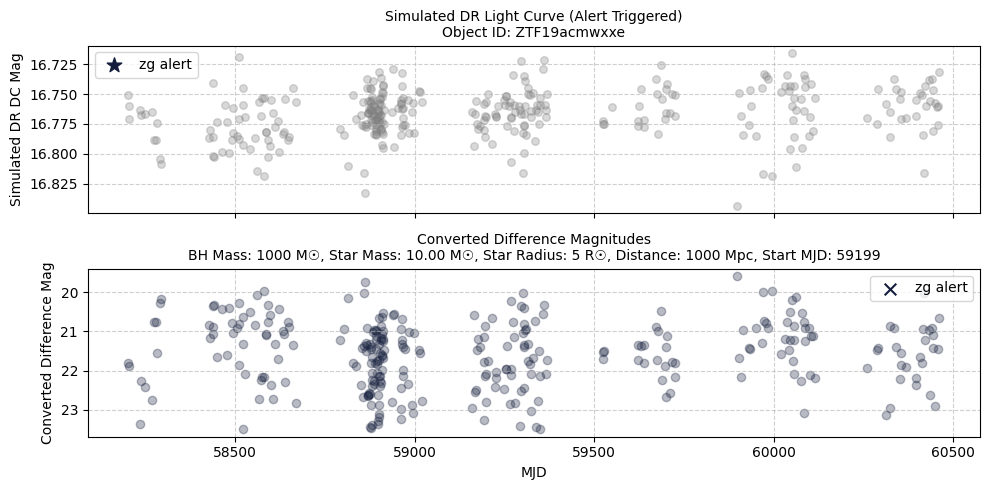

----------------------------------------


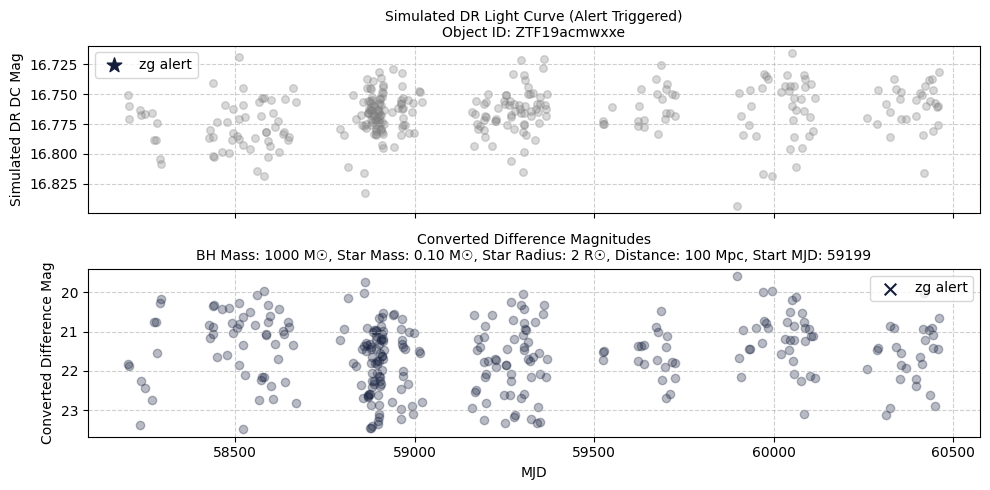

----------------------------------------


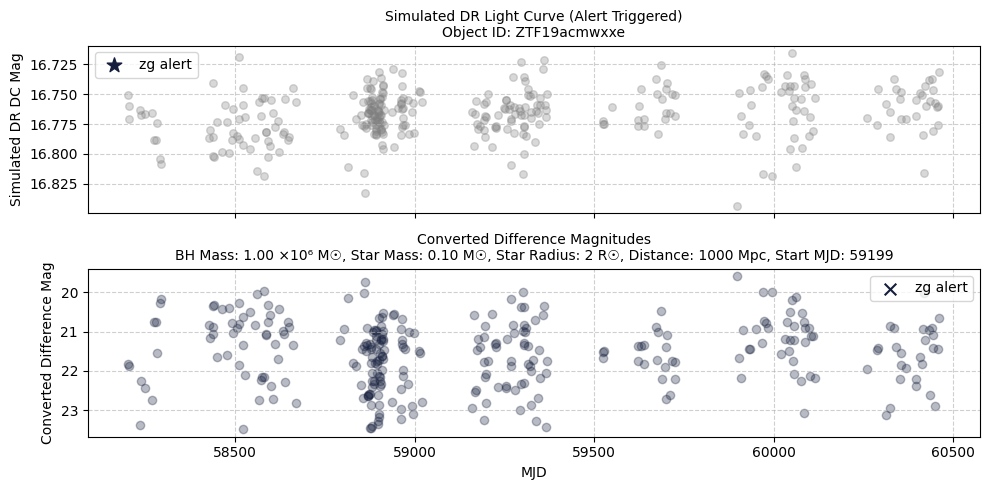

----------------------------------------


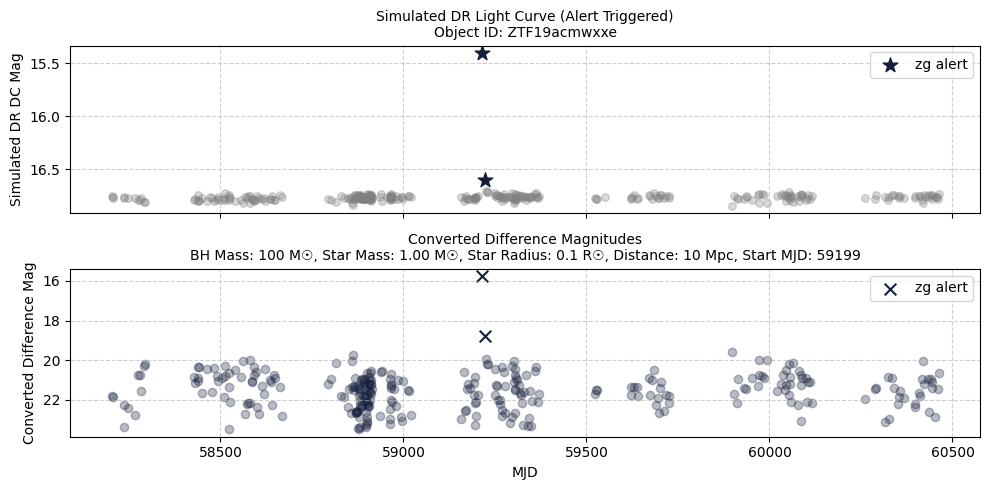

----------------------------------------


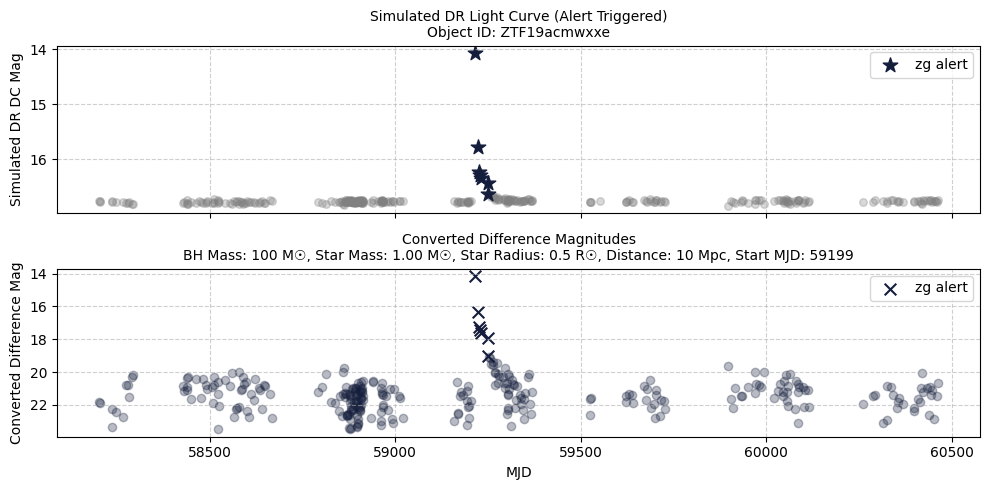

----------------------------------------


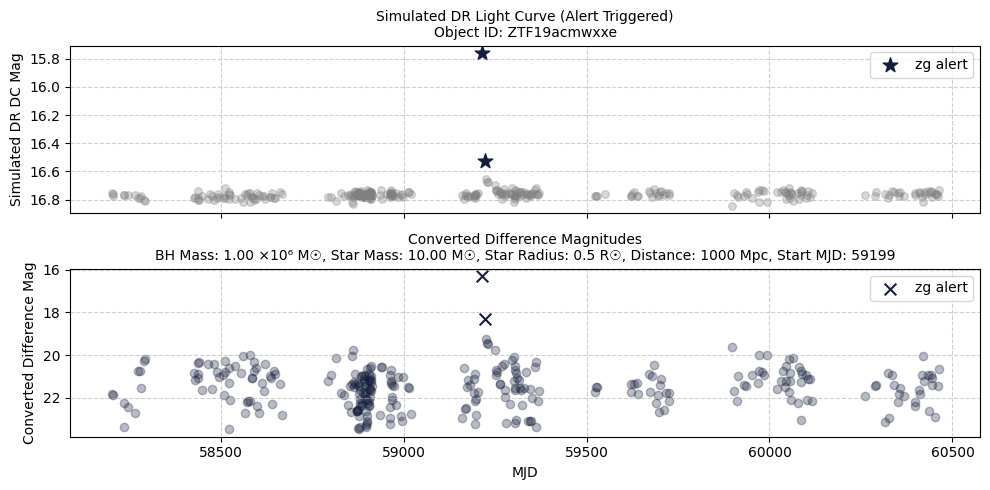

----------------------------------------


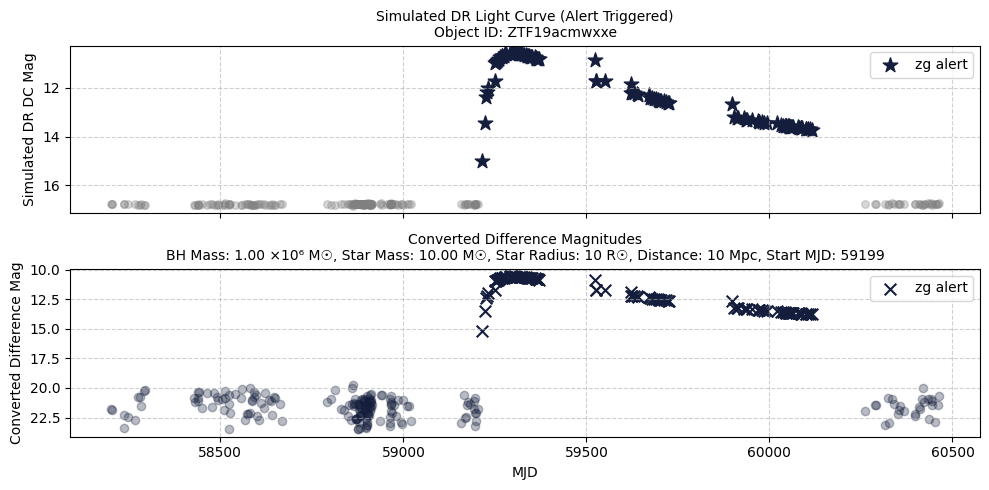

----------------------------------------


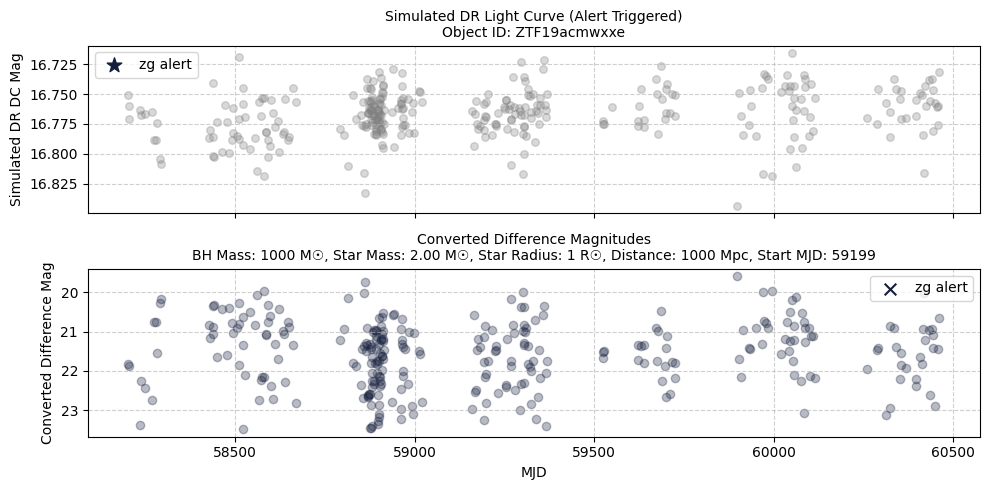

----------------------------------------


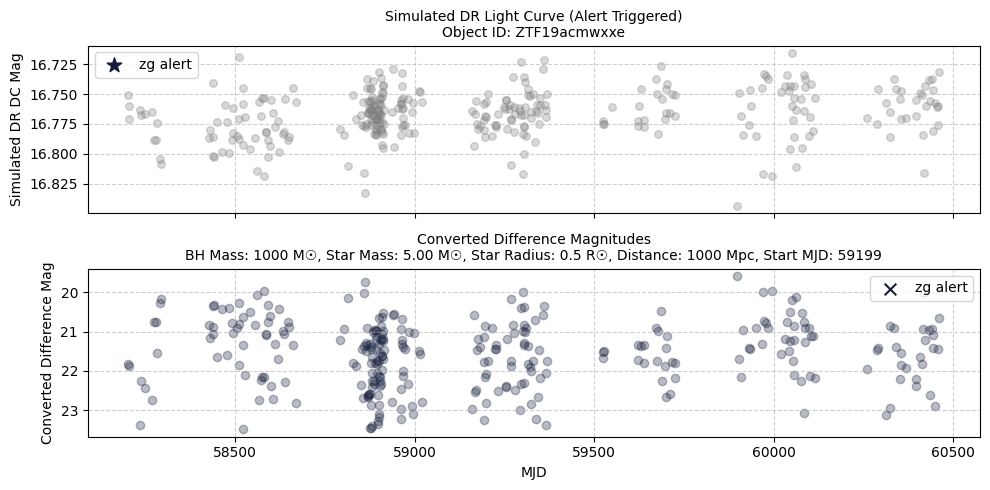

----------------------------------------


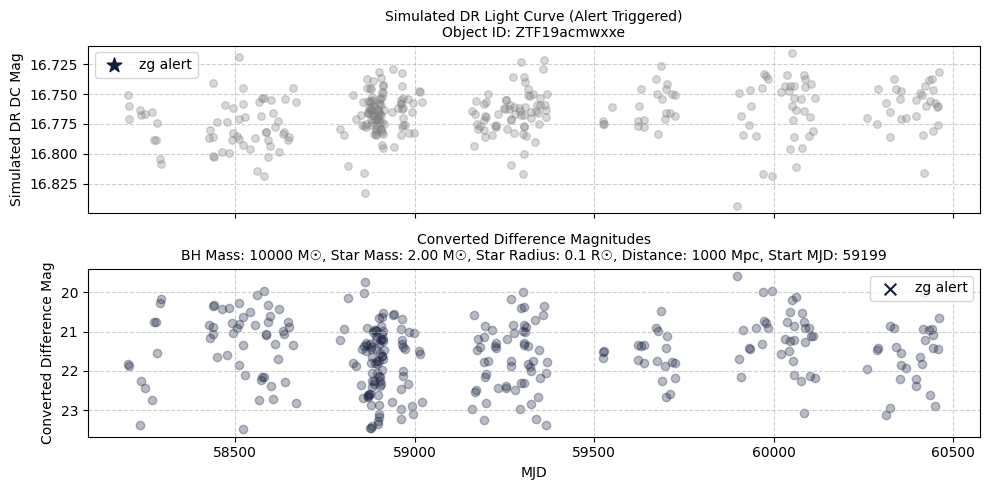

----------------------------------------


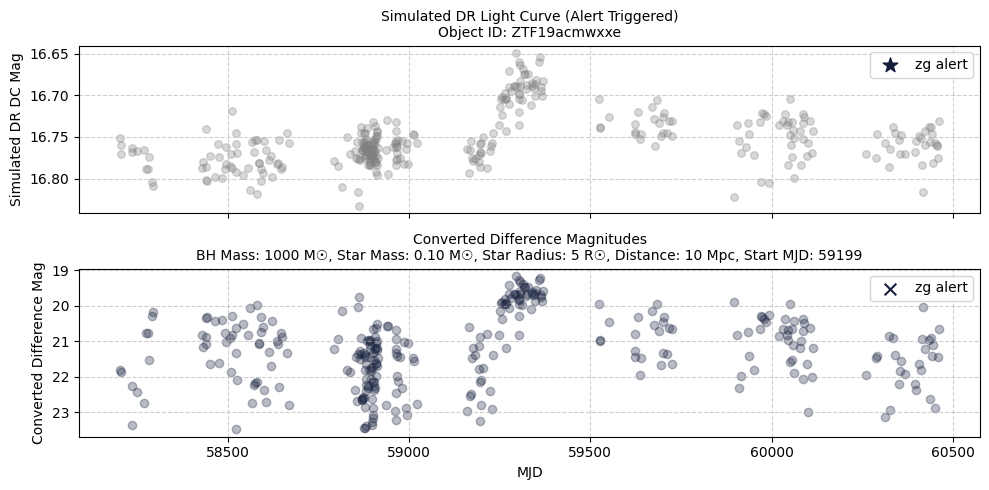

----------------------------------------


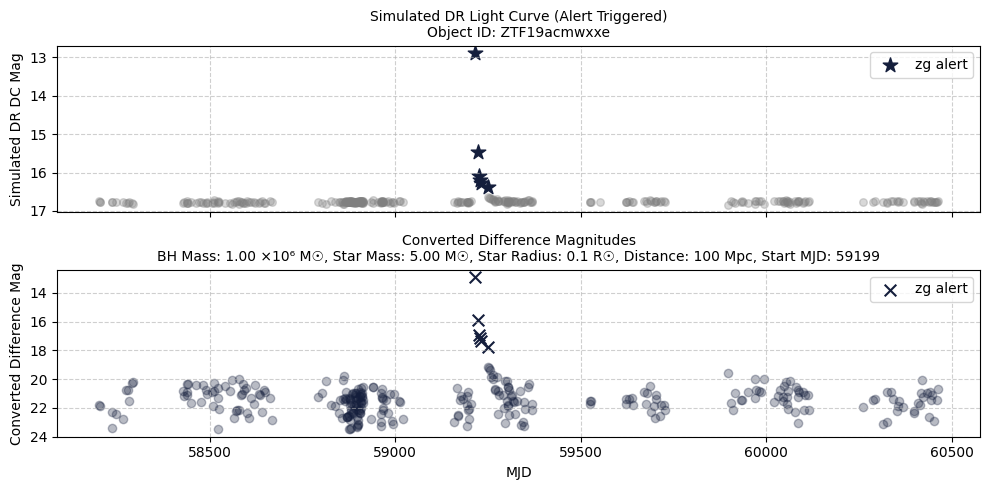

----------------------------------------


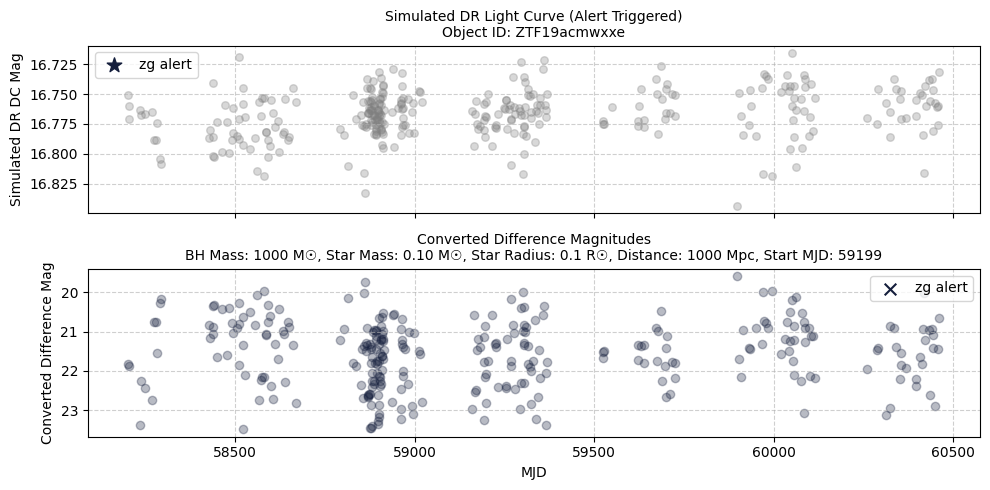

----------------------------------------


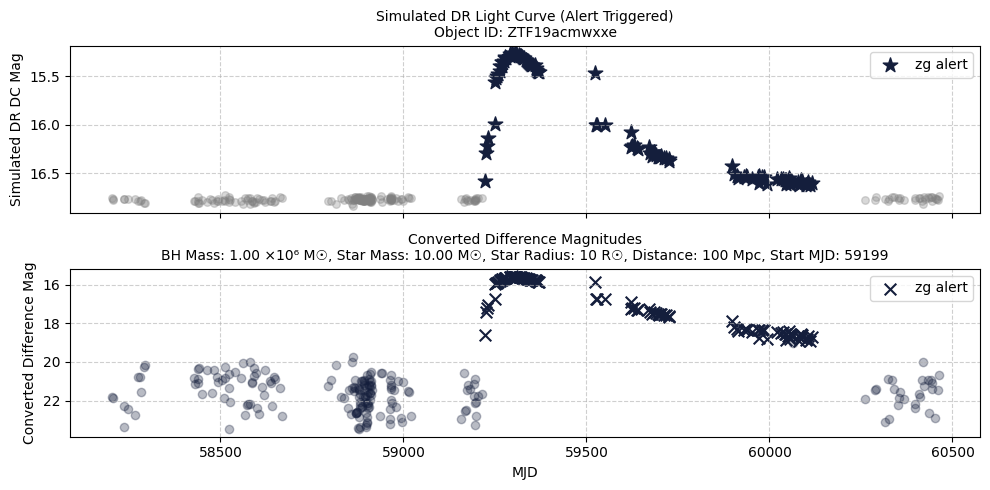

----------------------------------------


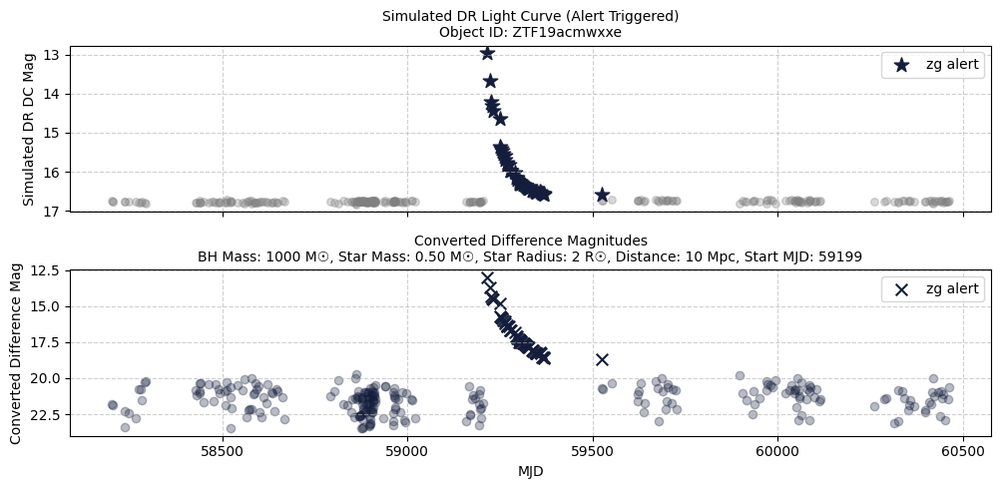

----------------------------------------


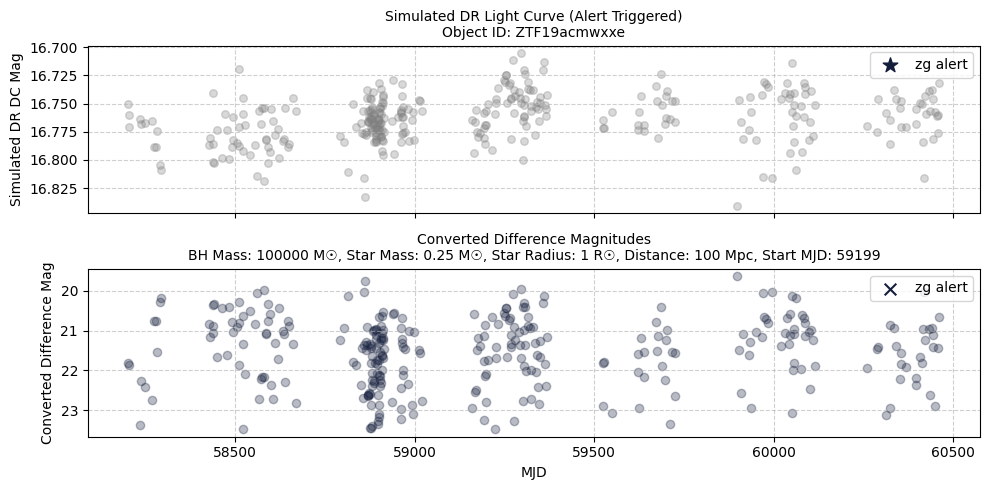

----------------------------------------


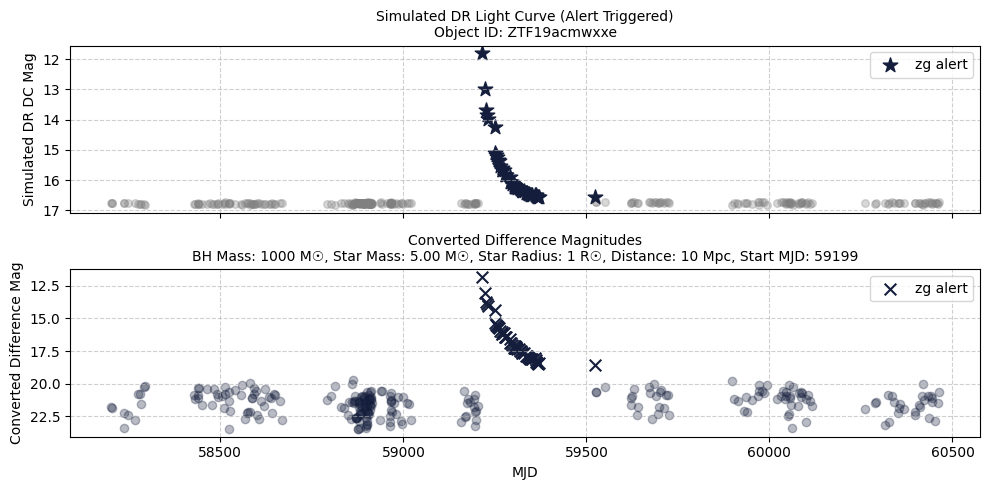

----------------------------------------


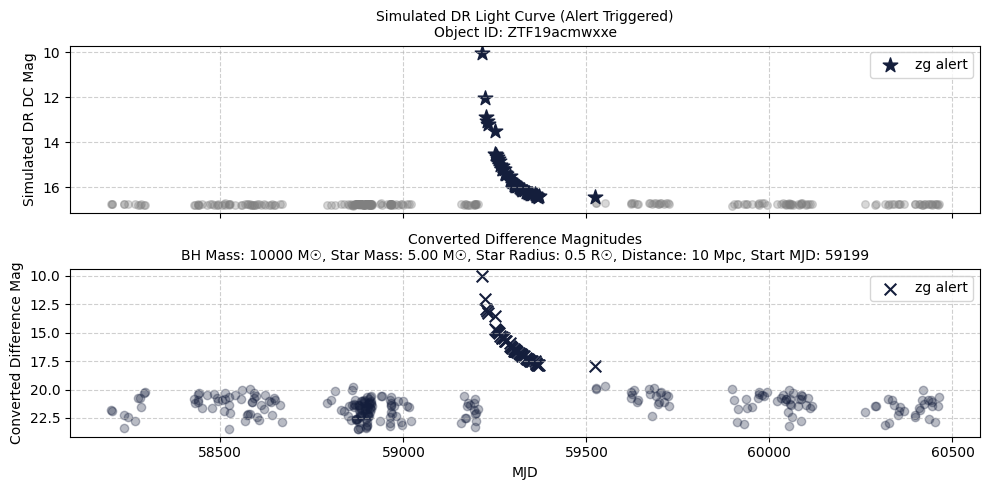

----------------------------------------


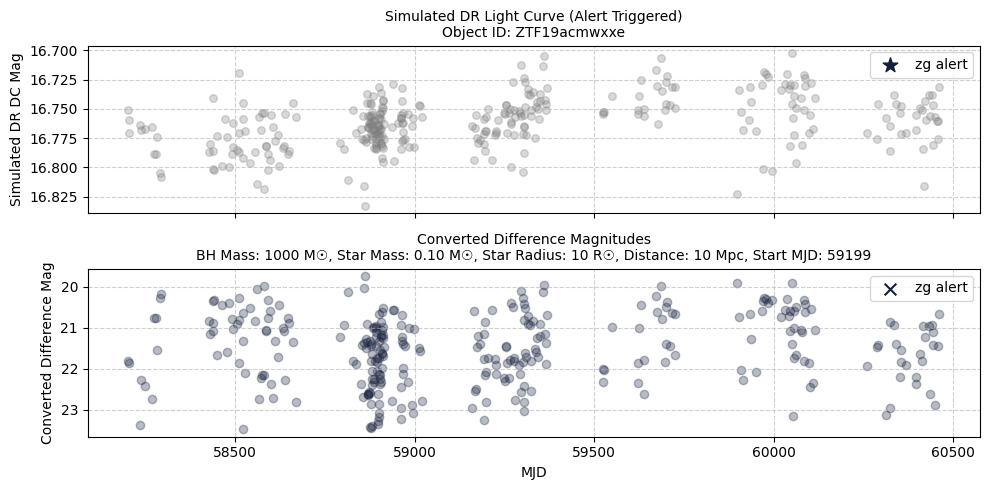

----------------------------------------


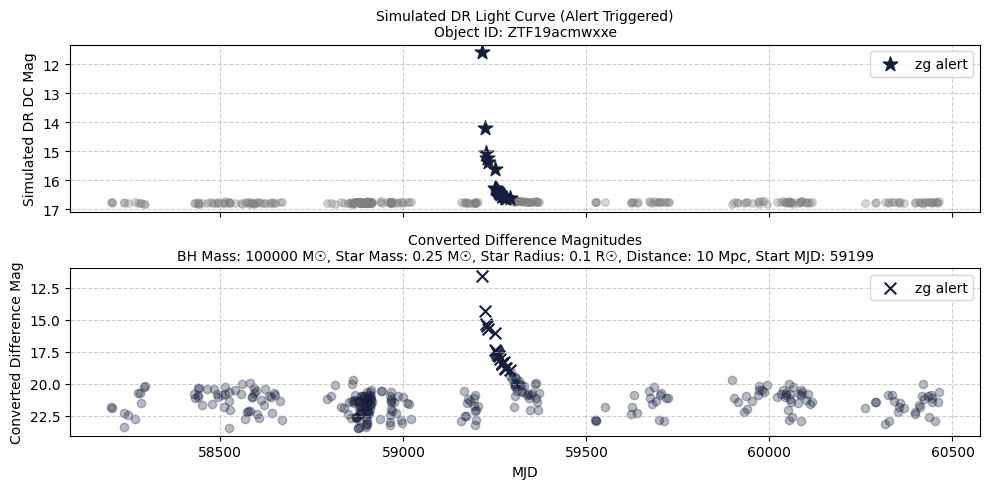

----------------------------------------


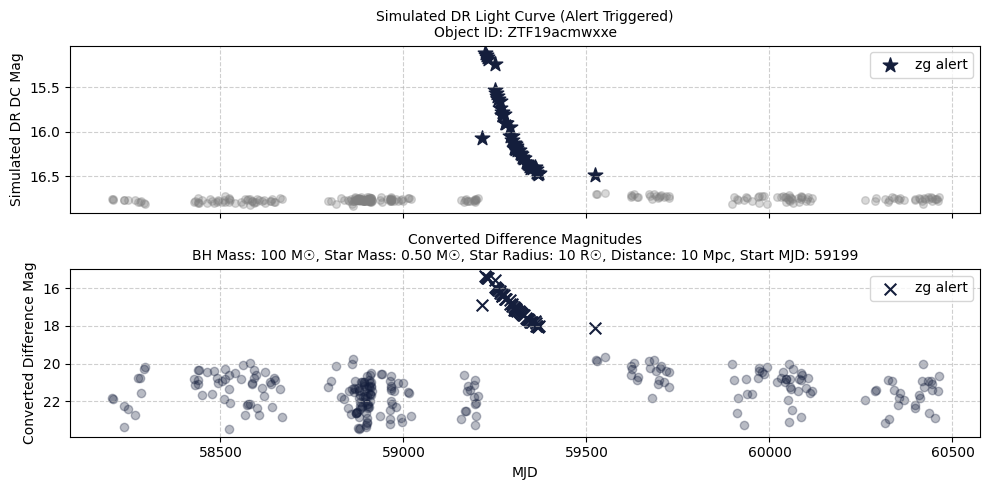

----------------------------------------


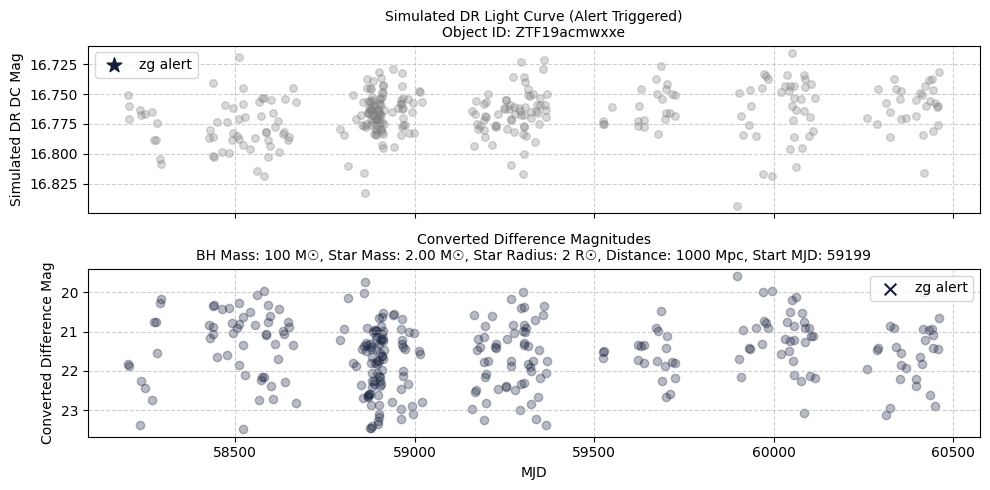

----------------------------------------


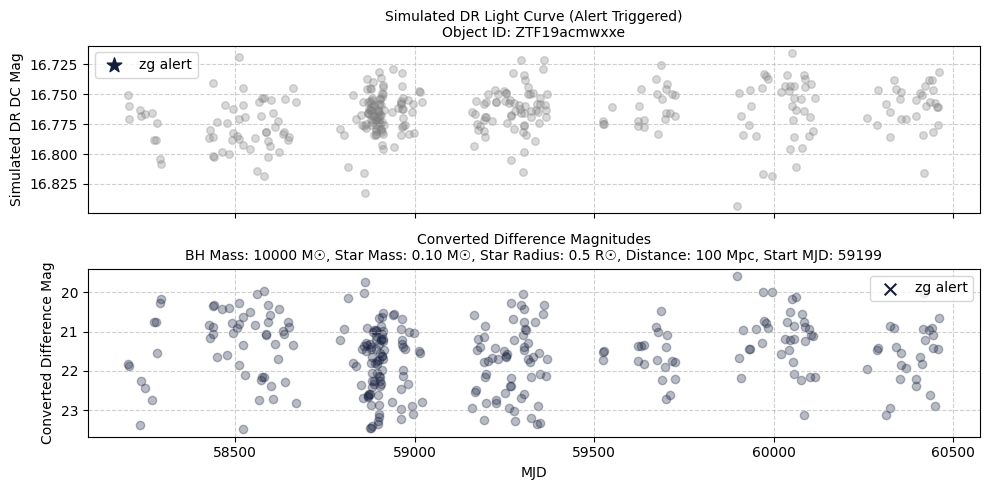

----------------------------------------


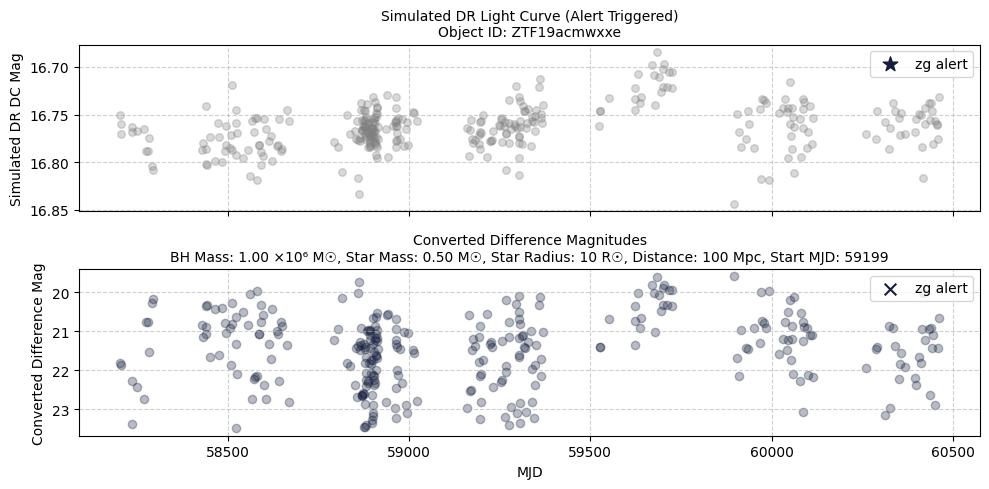

----------------------------------------


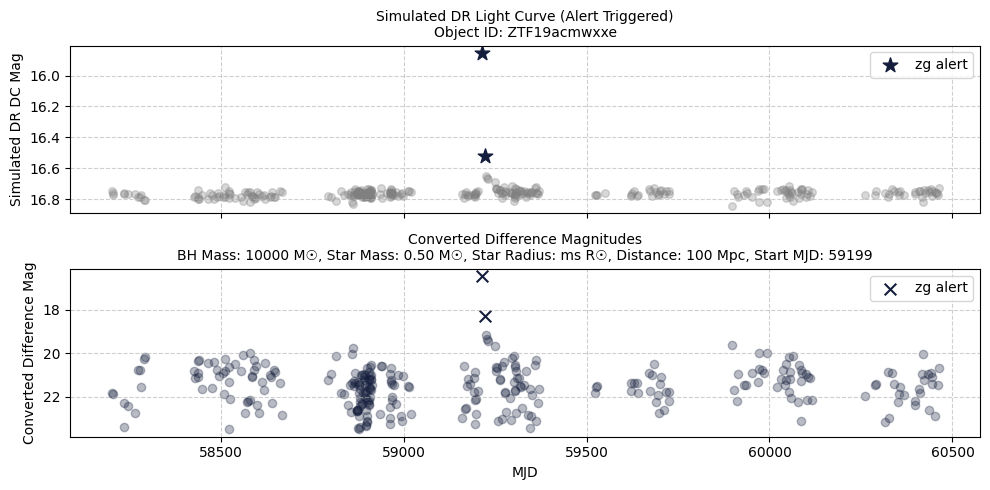

----------------------------------------


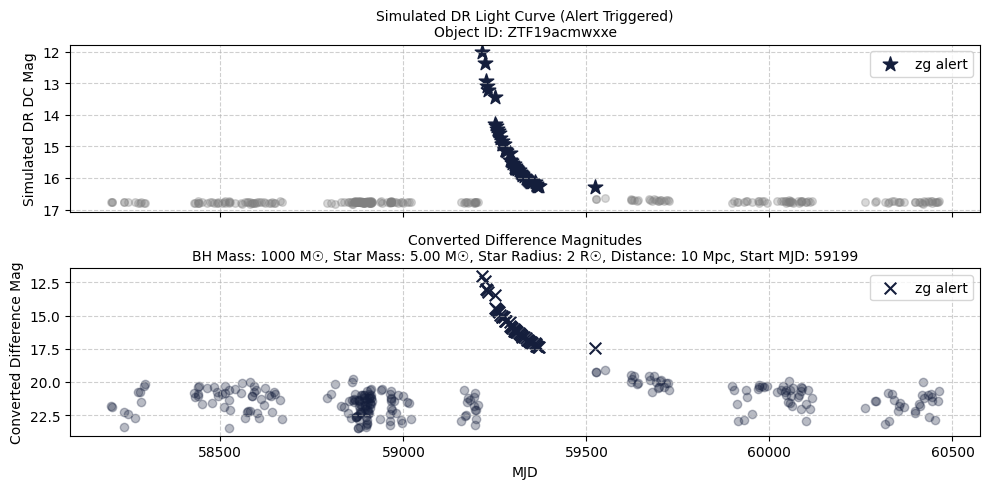

----------------------------------------


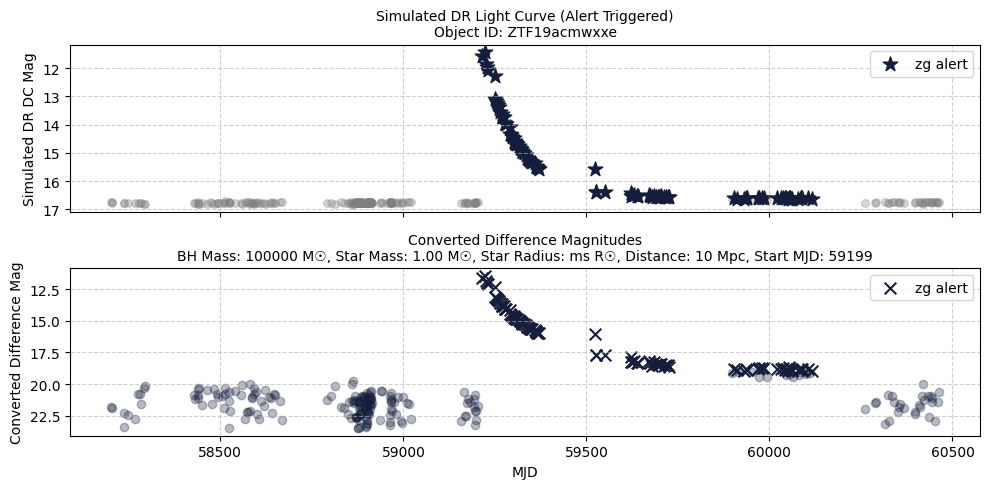

----------------------------------------


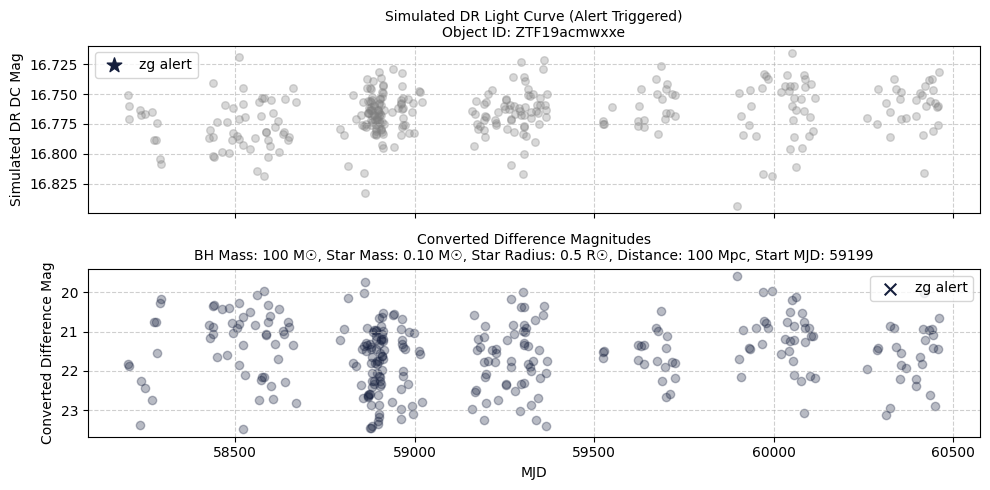

----------------------------------------


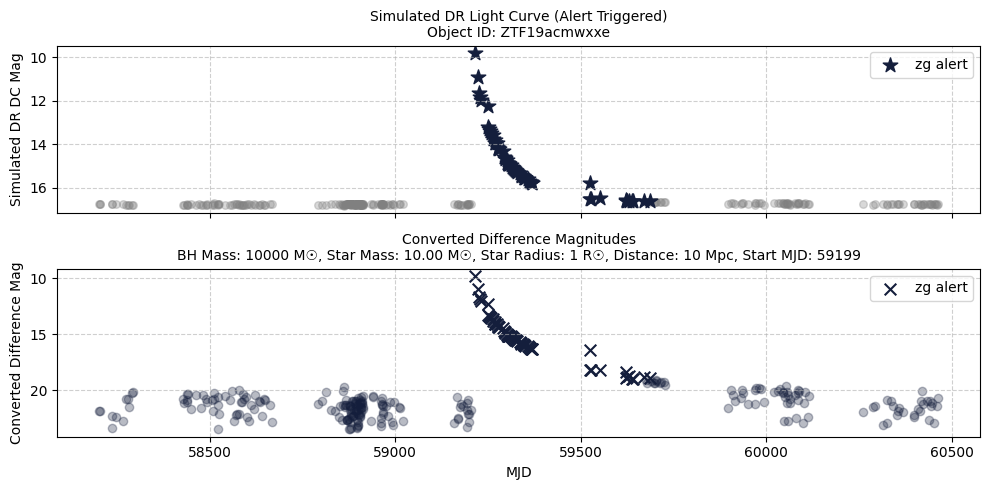

----------------------------------------


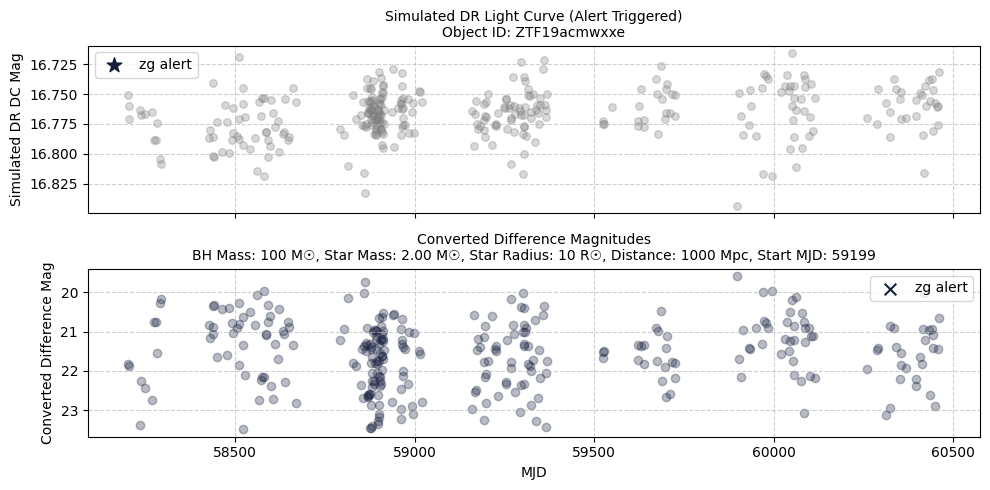

----------------------------------------


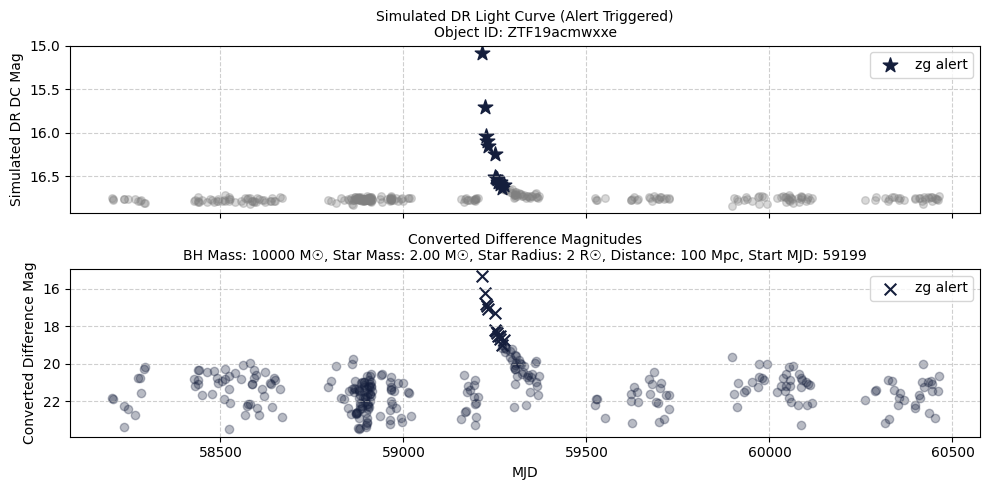

----------------------------------------


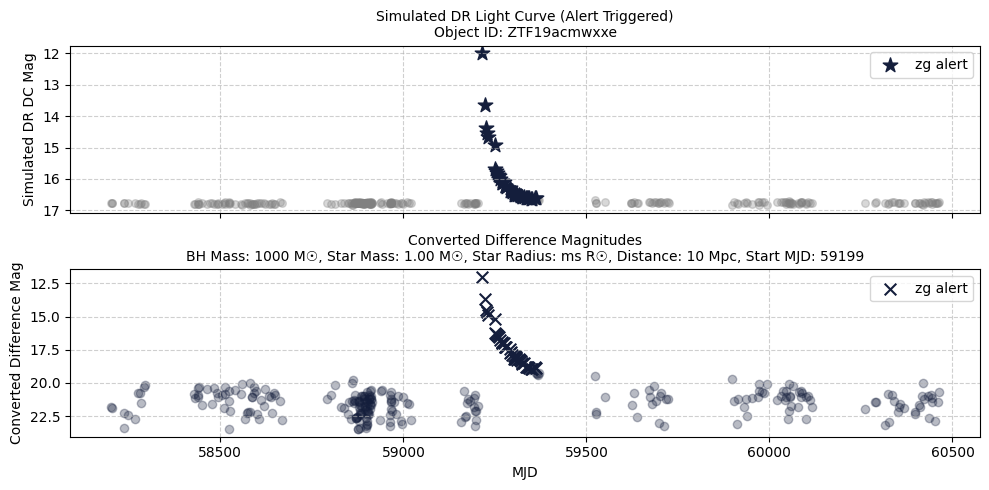

----------------------------------------


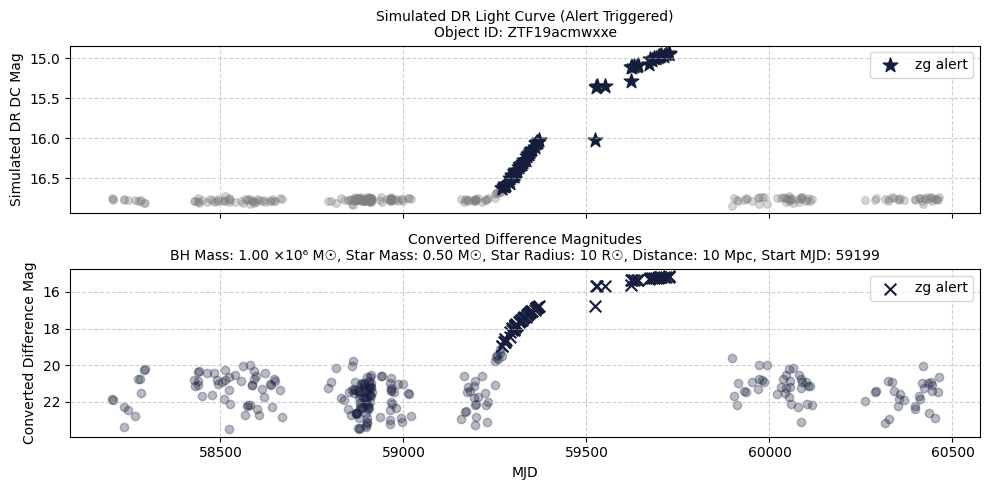

----------------------------------------


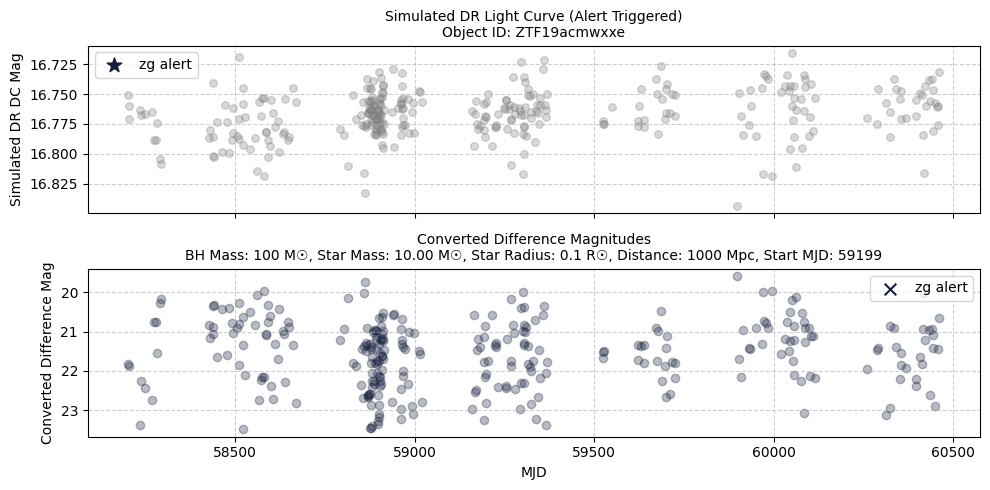

----------------------------------------


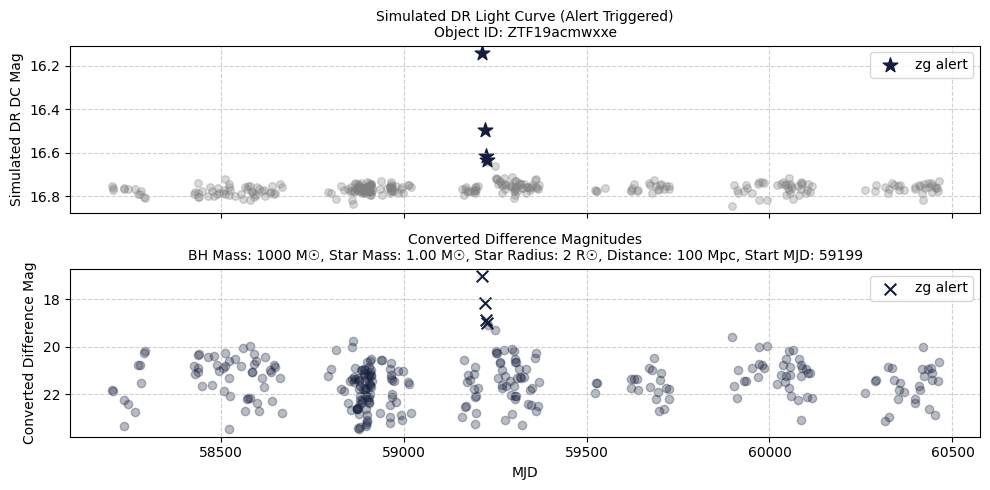

----------------------------------------


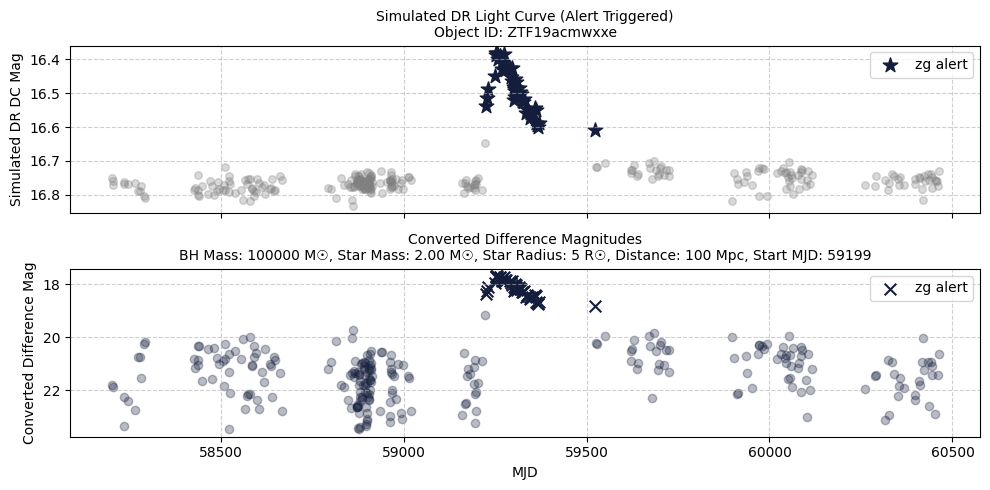

----------------------------------------


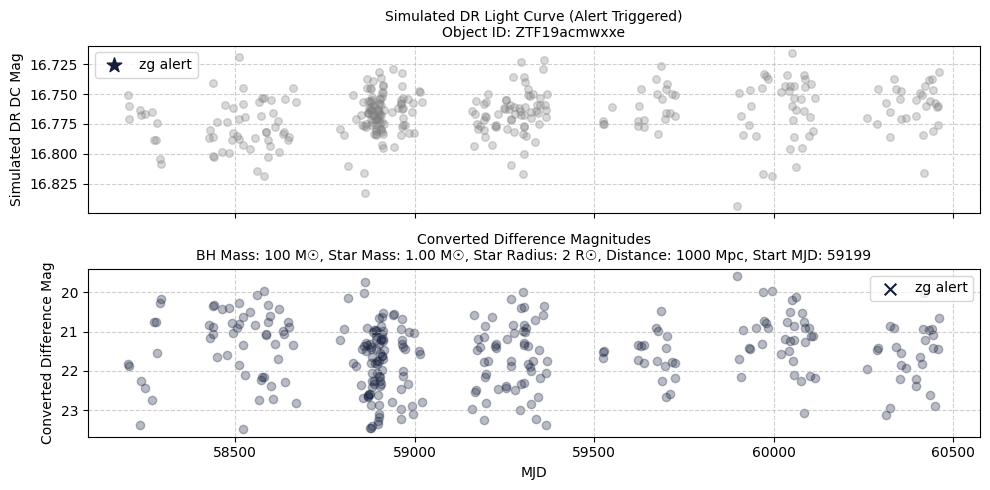

----------------------------------------


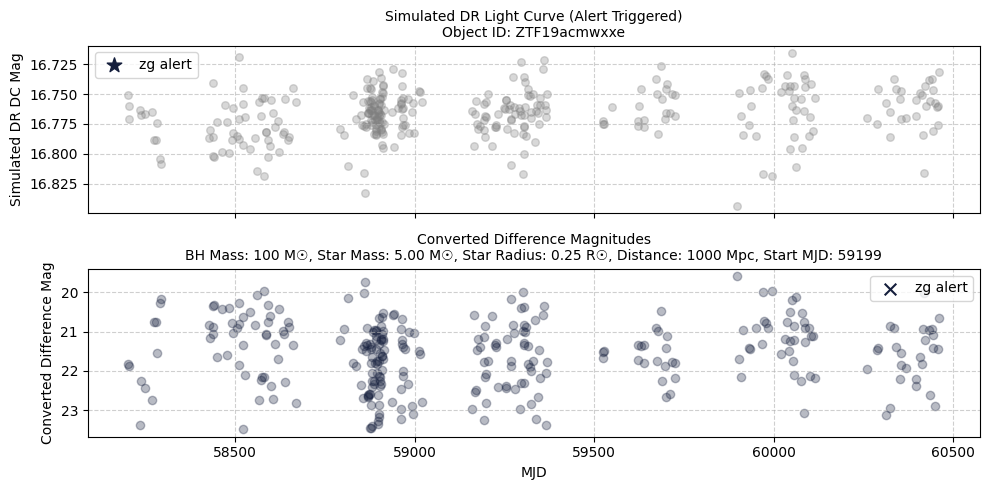

----------------------------------------


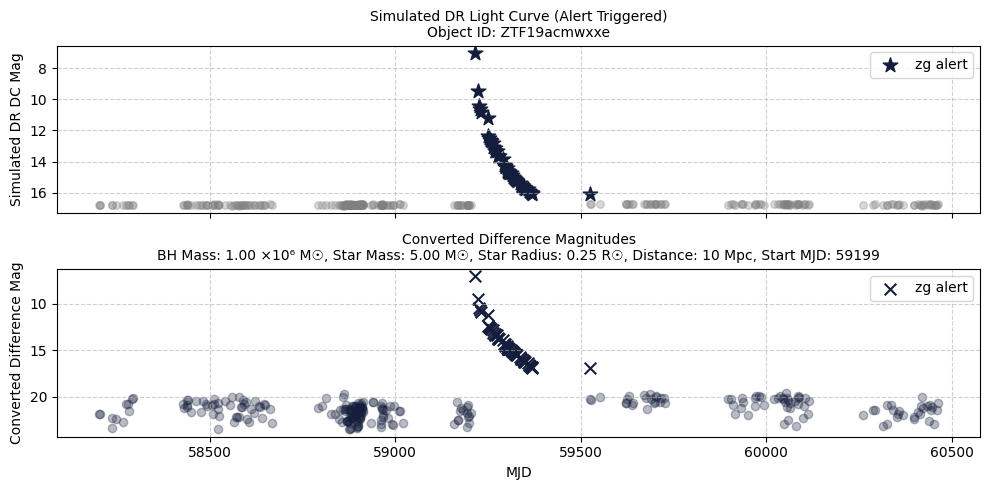

----------------------------------------


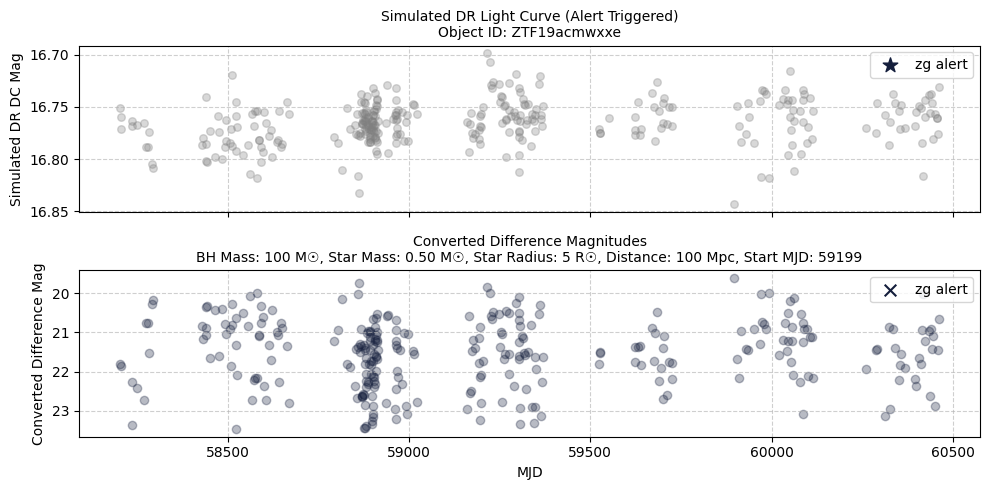

----------------------------------------


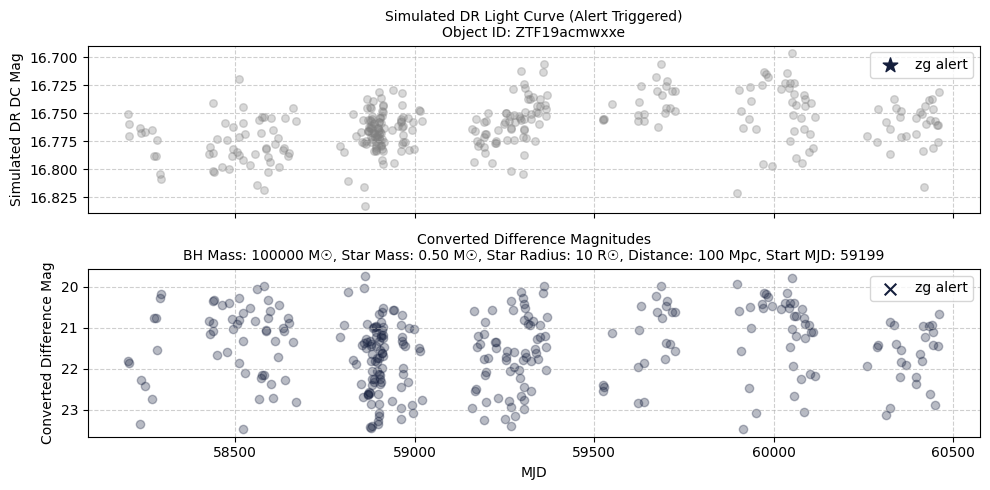

----------------------------------------


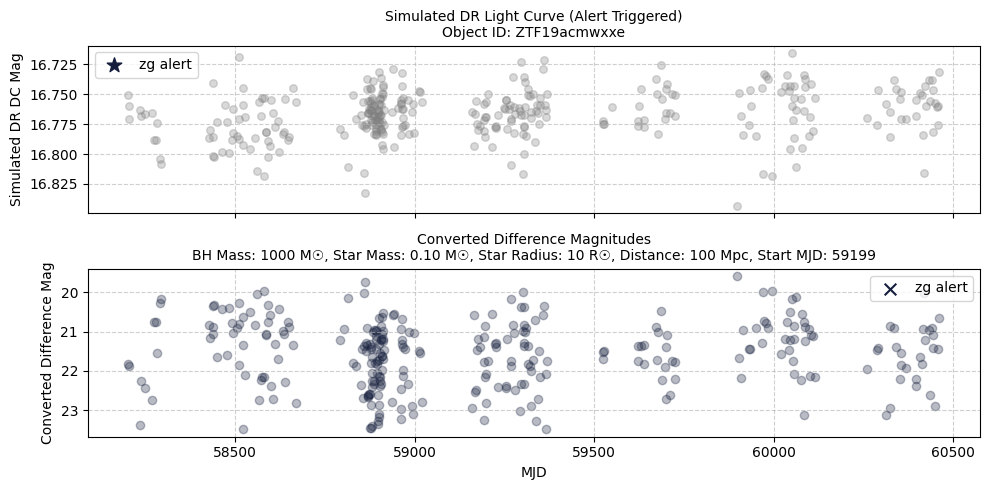

----------------------------------------


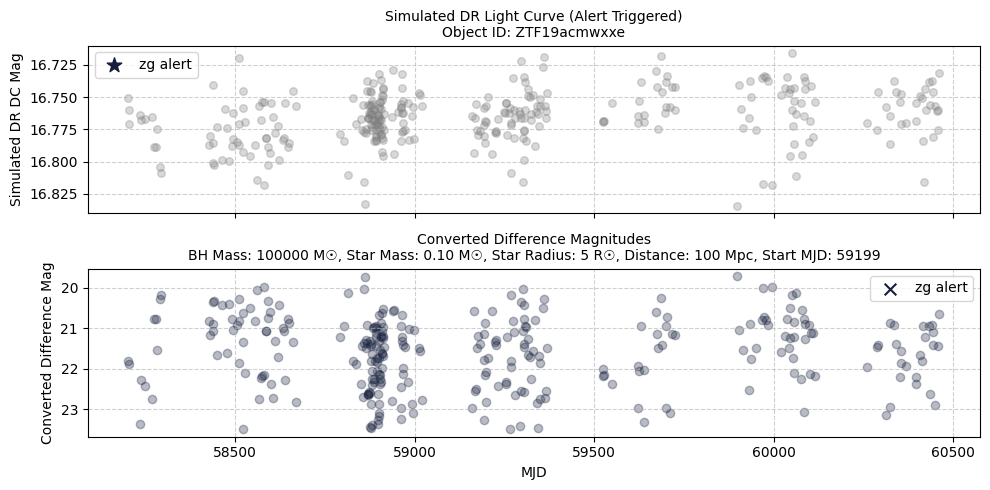

----------------------------------------


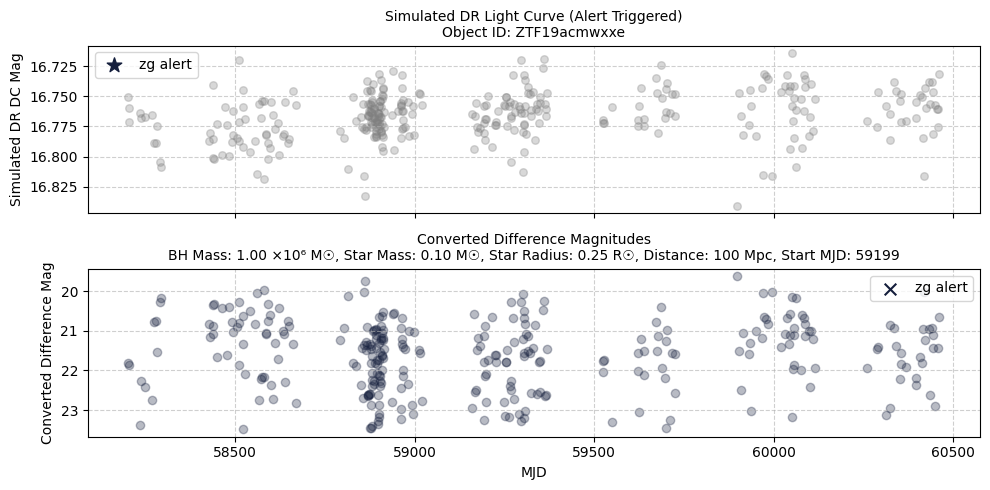

----------------------------------------


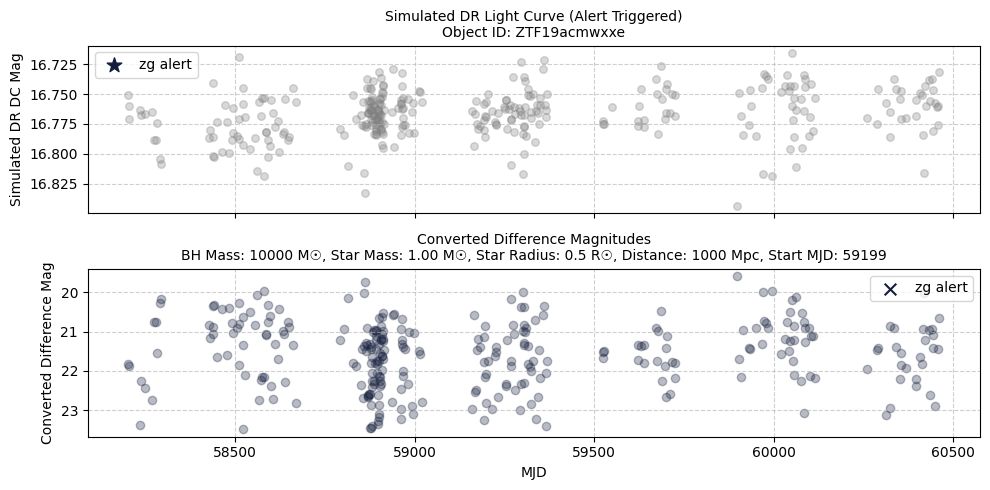

----------------------------------------


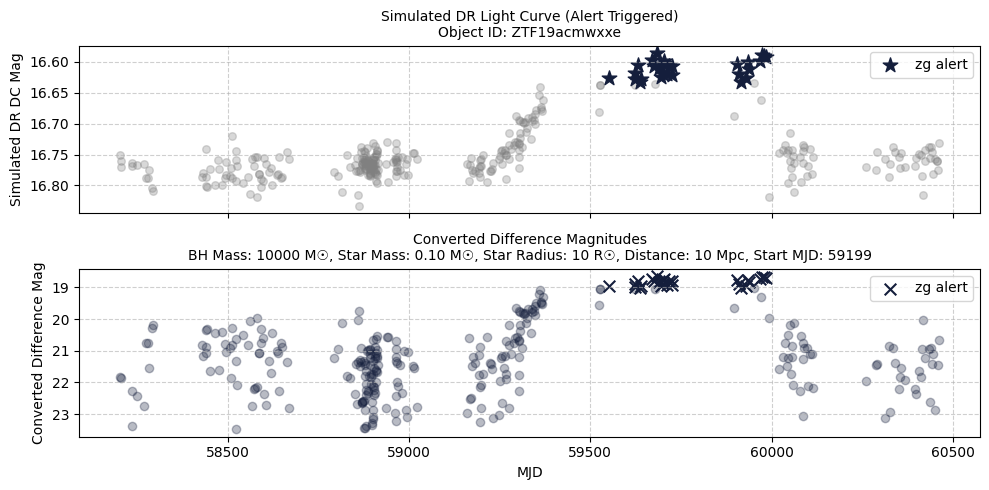

----------------------------------------


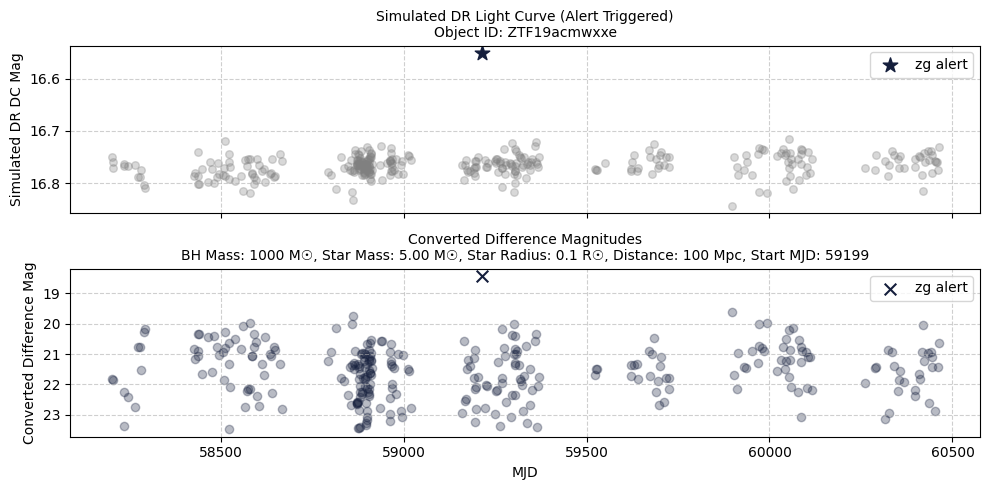

----------------------------------------


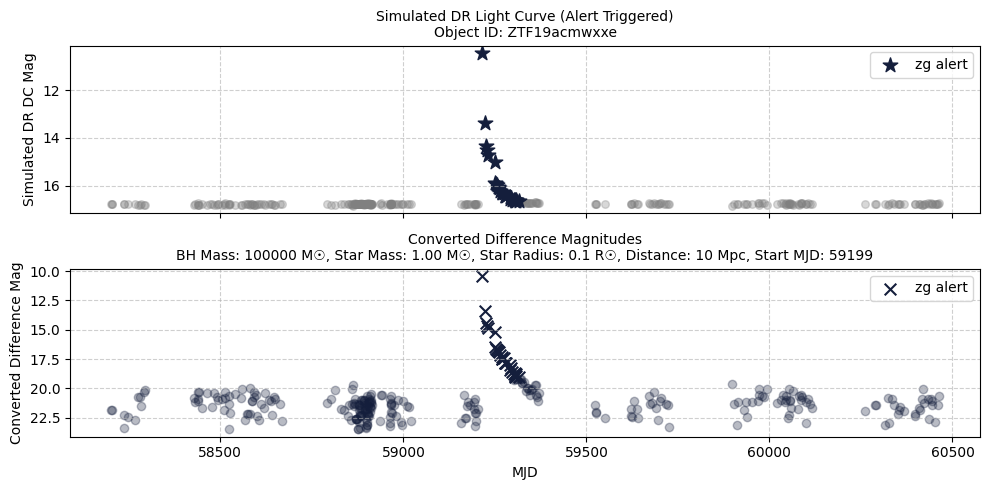

----------------------------------------


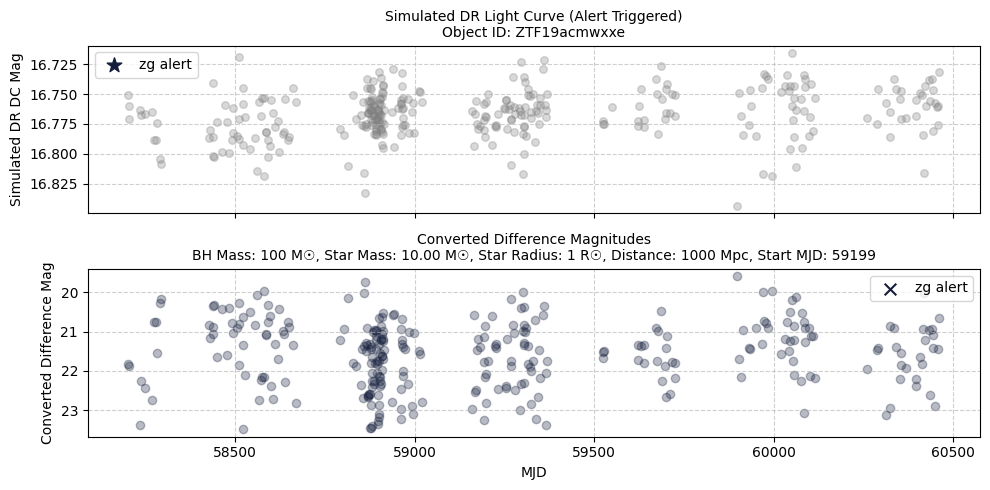

----------------------------------------


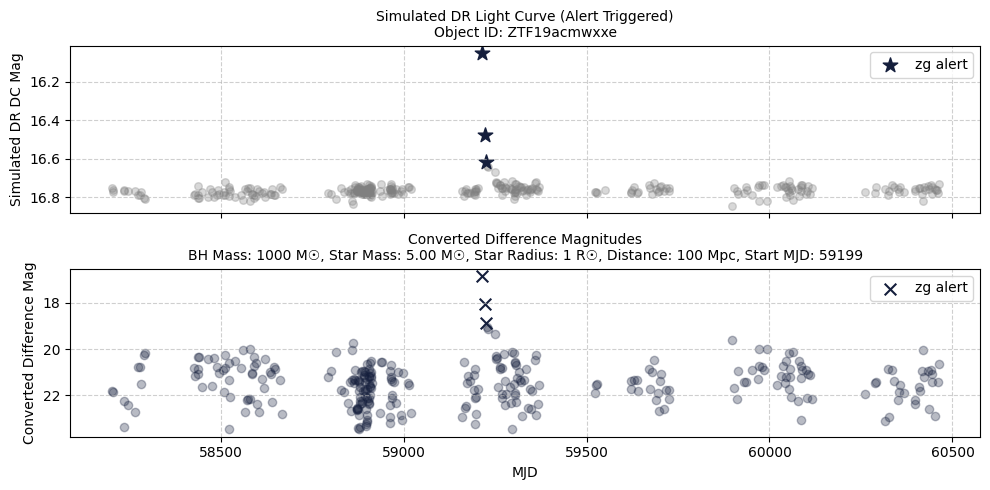

----------------------------------------


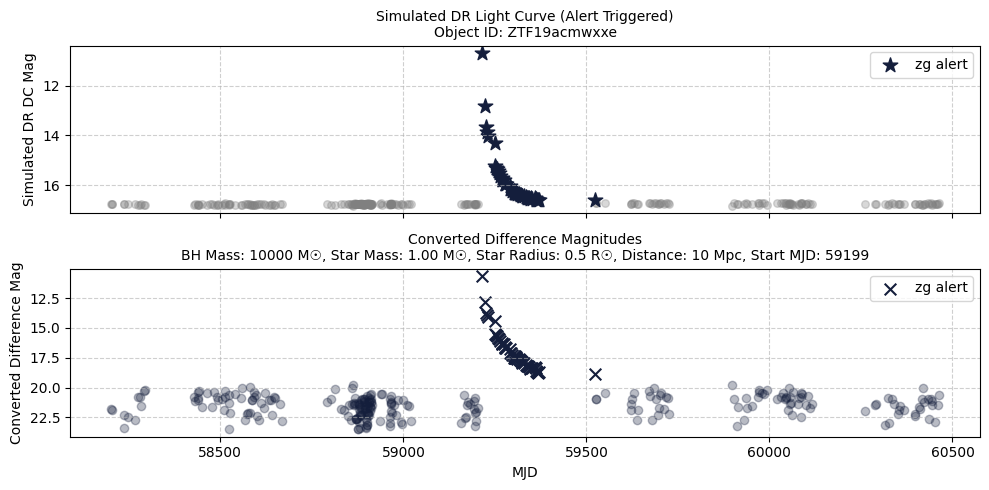

----------------------------------------


In [157]:
import glob
import random
simulated_dr_files_list = glob.glob("/Users/rupesh/CRP8/ymc/simulated_data/ZTF19acmwxxe/data/ZTF19acmwxxe*.csv")
alert_file = "/Users/rupesh/CRP8/ymc/raw_data/fink_data/ZTF19acmwxxe.csv"

simulated_dr_files_list = random.sample(simulated_dr_files_list, 75)
OBJECT_ID = "ZTF19acmwxxe"
for each_simulated_file in simulated_dr_files_list:

    plot_simulated_dr_with_alerts_and_config(
        simulated_dr_file=each_simulated_file,
        alert_file=alert_file,
        band_mapping=BAND_MAPPING,
        colors=COLORS,
        sigma_thresh=5.0,
        object_id=OBJECT_ID
    )
    print("-" * 40) 
    